In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import math
from scipy import stats
import matplotlib.dates as mdates
from plotly import tools
import plotly.tools as tls
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, plot, iplot
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

init_notebook_mode(connected=True)
%matplotlib inline
plt.style.use("fivethirtyeight")
plt.rc("figure", autolayout=True)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)
import warnings
warnings.filterwarnings("ignore")

In [4]:
import mplfinance as mpf
from prophet import Prophet
from prophet.plot import plot_plotly, add_changepoints_to_plot
import pmdarima as pm
from pmdarima.arima.utils import ndiffs

In [5]:
df = pd.read_csv("all_stocks_5yr.csv")
df.head().style.set_properties(**{'background-color': 'black',
                                    'color': 'lawngreen',
                                    'border': '1.5px  white'})

,date,open,high,low,close,volume,Name
0,2013-02-08,15.070000,15.120000,14.630000,14.750000,8407500,AAL
1,2013-02-11,14.890000,15.010000,14.260000,14.460000,8882000,AAL
2,2013-02-12,14.450000,14.510000,14.100000,14.270000,8126000,AAL
3,2013-02-13,14.300000,14.940000,14.250000,14.660000,10259500,AAL
4,2013-02-14,14.940000,14.960000,13.160000,13.990000,31879900,AAL


In [6]:
# define simple function get all the information needed
def information_func(df):

    # unique stocks
    print("Uniques stocks available in dataset:", df['Name'].nunique())
    print("----"*20)

    # metadata of dataset
    print("Metadata of the dataset:\n")
    df.info()
    print("----"*20)

    # missing values
    null = df.isnull().sum()
    print(null)
    print("----"*20)

    # max range of stocks dataset
    delta = (pd.to_datetime(df['date']).max() - pd.to_datetime(df['date']).min())
    print("Time range of stocks dataset:\n", delta)
    print("----"*20)

In [7]:
rdf = df.rename(columns={'Name':'ticks'})
rdf.dropna(inplace=True)
new_df = rdf.copy()
new_df.loc[:, 'date'] = pd.to_datetime(rdf.loc[:, 'date'], format='%Y-%m-%d')
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 619029 entries, 0 to 619039
Data columns (total 7 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   date    619029 non-null  object 
 1   open    619029 non-null  float64
 2   high    619029 non-null  float64
 3   low     619029 non-null  float64
 4   close   619029 non-null  float64
 5   volume  619029 non-null  int64  
 6   ticks   619029 non-null  object 
dtypes: float64(4), int64(1), object(2)
memory usage: 37.8+ MB


In [8]:
# find the average volume of each stocks using function and sort top 10 most traded stocks
mean_dict = {}
for key in new_df['ticks'].unique():
    value = new_df[new_df['ticks'] == key ]['volume'].mean()
    mean_dict[key]= value

print("Length of the mean of ticks dictionary:", len(mean_dict))
avaerage_s = pd.Series(mean_dict).transpose()
top10_s = avaerage_s.sort_values(ascending=False)[:10]

print("Top 10 company tickers with highest average traded stock volume:\n", top10_s.index)

Length of the mean of ticks dictionary: 505
Top 10 company tickers with highest average traded stock volume:
 Index(['BAC', 'AAPL', 'GE', 'F', 'FB', 'MSFT', 'AMD', 'MU', 'INTC', 'CSCO'], dtype='object')


In [9]:
# function to return top 10 sub dataframe
def subdataframe(df, tick):

    # top 10 ticks
    ticks = list(top10_s.index)

    assert tick in ticks, """Stock tick does not belong to top 10 stocks by trade volume, please try any of these:\n
    ['BAC', 'AAPL', 'GE', 'F', 'FB', 'MSFT', 'AMD', 'MU', 'INTC', 'CSCO']"""

    ndf = new_df[new_df['ticks'] == tick]
    return ndf

In [10]:
# company dict for respective ticks (TOP 10 STOCKS BY AVERAGE TRAE VOLUME)
company_dict = {'BAC':'Bank of America',
                'AAPL':'Apple',
                'GE':'General Electric',
                'F':'Ford Motor Company',
                'FB':'Facebook',
                'MSFT':'Microsoft',
                'AMD':'Adavanced Micro Devices',
                'MU':'Micron Technology',
                'INTC':'Intel Corp',
                'CSCO':'Cisco'
               }

bac_df = subdataframe(new_df, 'BAC')
aapl_df = subdataframe(new_df, 'AAPL')
ge_df = subdataframe(new_df, 'GE')
f_df = subdataframe(new_df, 'F')
fb_df = subdataframe(new_df, 'FB')
msft_df = subdataframe(new_df, 'MSFT')
amd_df = subdataframe(new_df, 'AMD')
mu_df = subdataframe(new_df, 'MU')
intc_df = subdataframe(new_df, 'INTC')
csco_df = subdataframe(new_df, 'CSCO')


# define a function to return daily return and company column
def dailyfunc(df):
    df['daily return'] = ((df['close'] - df['open'])/df['open'])*100
    df.style.format('{:.2f}%', subset='daily return')
    df['daily_mean'] = (df['open'] + df['close'] + df['high'] + df['low'])/4
    df['co_name'] = company_dict[df['ticks'].unique()[0]]
    return df

bac_df = dailyfunc(bac_df)
aapl_df = dailyfunc(aapl_df)
ge_df = dailyfunc(ge_df)
f_df = dailyfunc(f_df)
fb_df = dailyfunc(fb_df)
msft_df = dailyfunc(msft_df)
amd_df = dailyfunc(amd_df)
mu_df = dailyfunc(mu_df)
intc_df = dailyfunc(intc_df)
csco_df = dailyfunc(csco_df)

print('\t\tStart Date\t\t\t\t\tEnd Date')
print(f"BAC\t\t{bac_df['date'].min()}\t\t\t{bac_df['date'].max()}")
print(f"AAPL\t\t{aapl_df['date'].min()}\t\t\t{aapl_df['date'].max()}")
print(f"GE\t\t{ge_df['date'].min()}\t\t\t{ge_df['date'].max()}")
print(f"F\t\t{f_df['date'].min()}\t\t\t{f_df['date'].max()}")
print(f"FB\t\t{fb_df['date'].min()}\t\t\t{fb_df['date'].max()}")
print(f"MSFT\t\t{msft_df['date'].min()}\t\t\t{msft_df['date'].max()}")
print(f"AMD\t\t{amd_df['date'].min()}\t\t\t{amd_df['date'].max()}")
print(f"MU\t\t{mu_df['date'].min()}\t\t\t{mu_df['date'].max()}")
print(f"INTC\t\t{intc_df['date'].min()}\t\t\t{intc_df['date'].max()}")
print(f"CSCO\t\t{csco_df['date'].min()}\t\t\t{csco_df['date'].max()}")

		Start Date					End Date
BAC		2013-02-08 00:00:00			2018-02-07 00:00:00
AAPL		2013-02-08 00:00:00			2018-02-07 00:00:00
GE		2013-02-08 00:00:00			2018-02-07 00:00:00
F		2013-02-08 00:00:00			2018-02-07 00:00:00
FB		2013-02-08 00:00:00			2018-02-07 00:00:00
MSFT		2013-02-08 00:00:00			2018-02-07 00:00:00
AMD		2013-02-08 00:00:00			2018-02-07 00:00:00
MU		2013-02-08 00:00:00			2018-02-07 00:00:00
INTC		2013-02-08 00:00:00			2018-02-07 00:00:00
CSCO		2013-02-08 00:00:00			2018-02-07 00:00:00


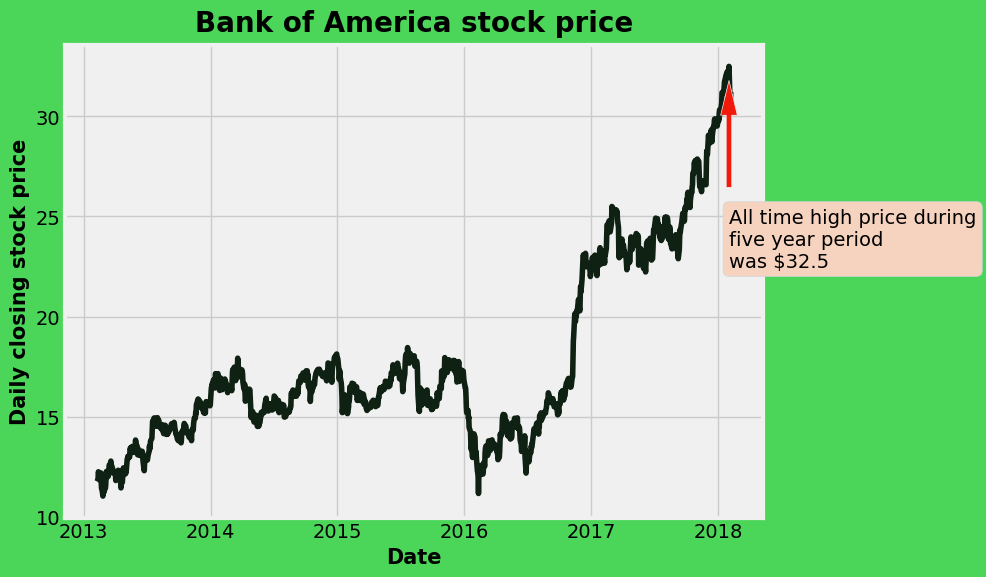

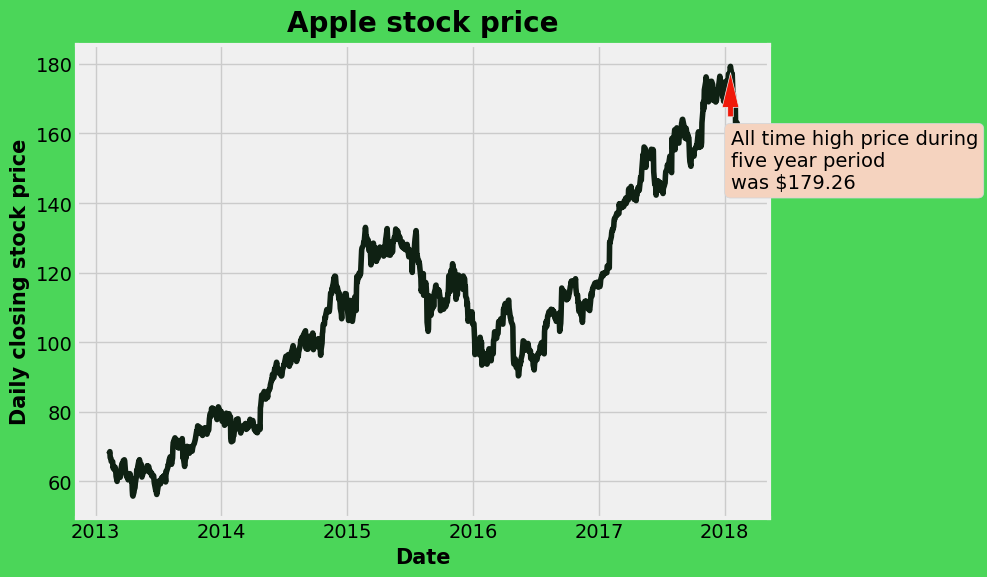

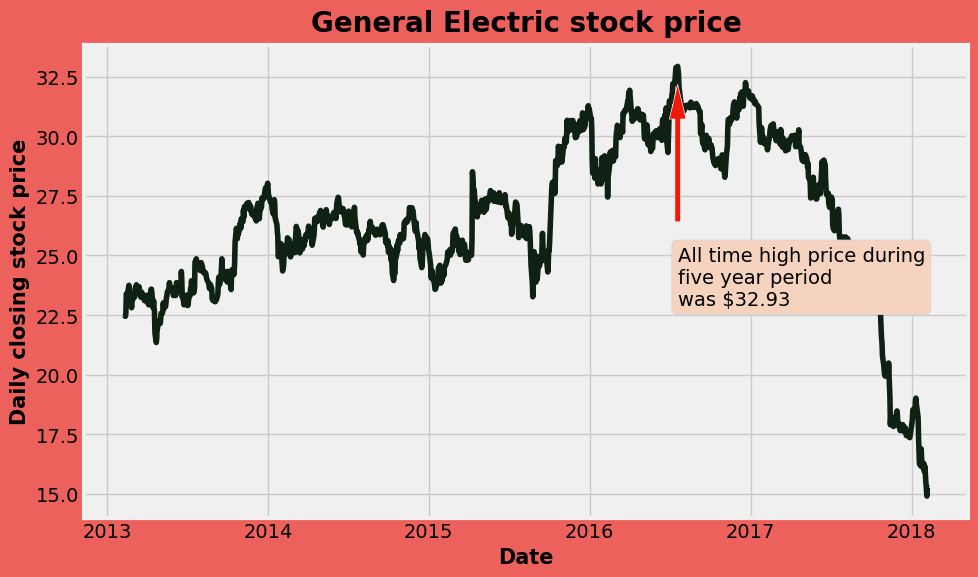

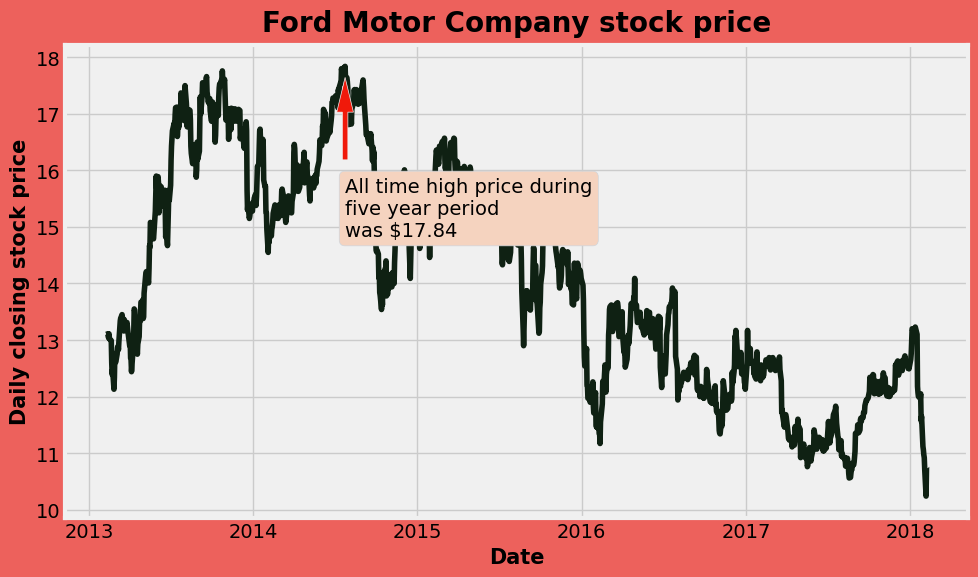

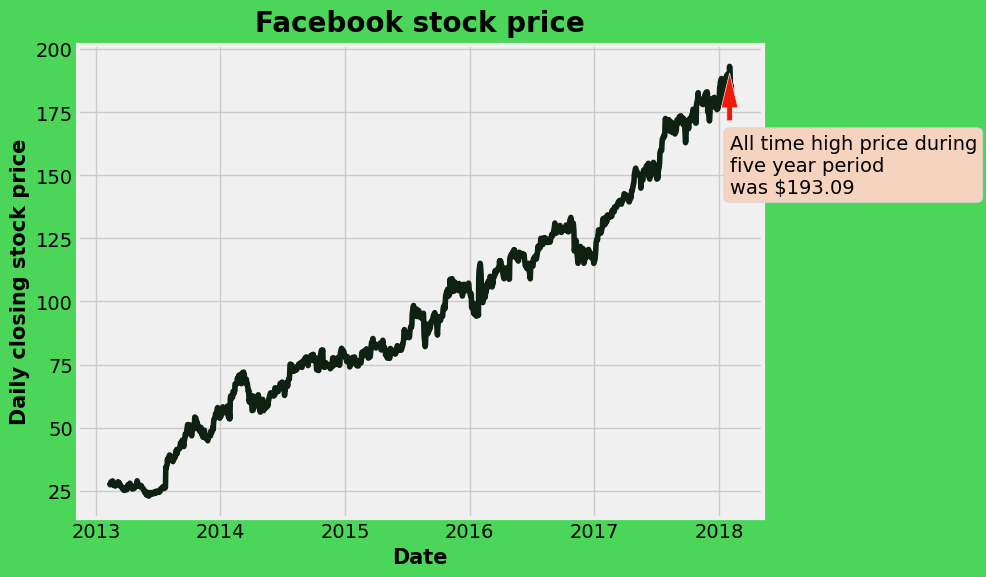

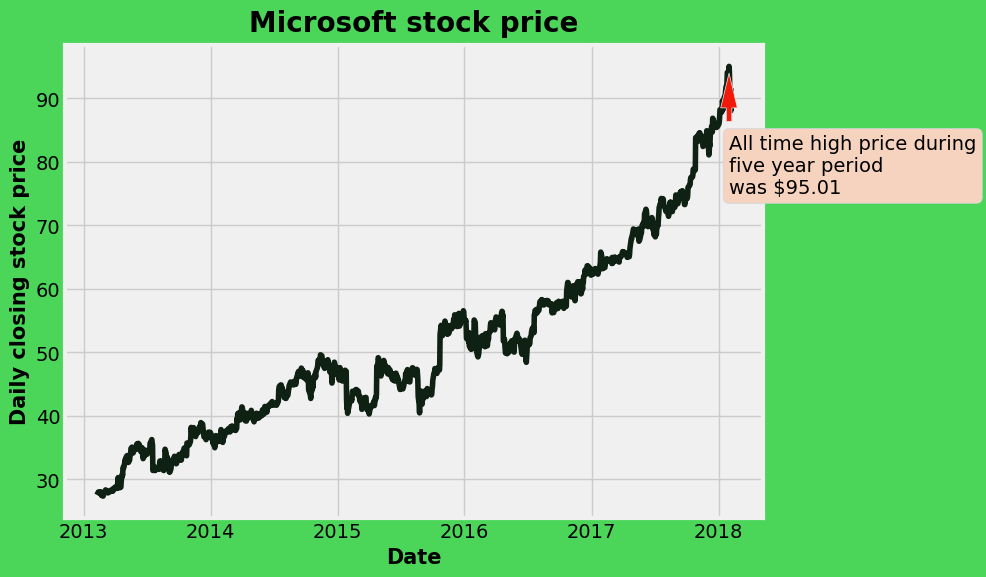

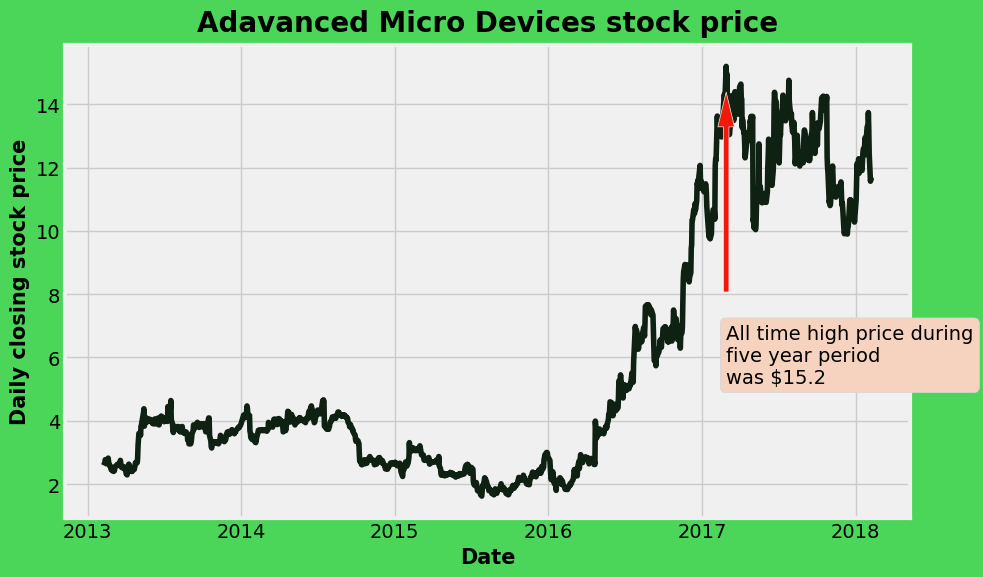

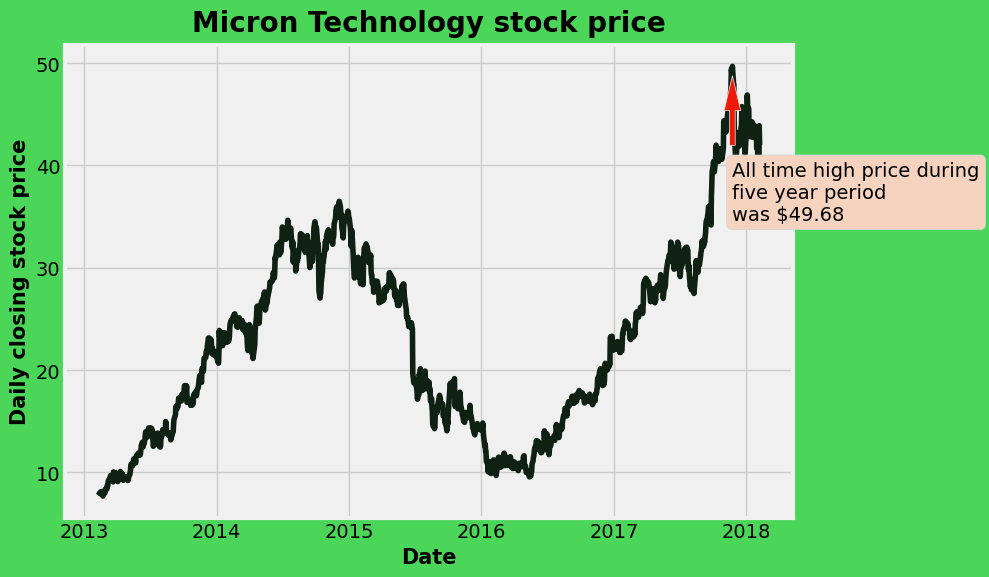

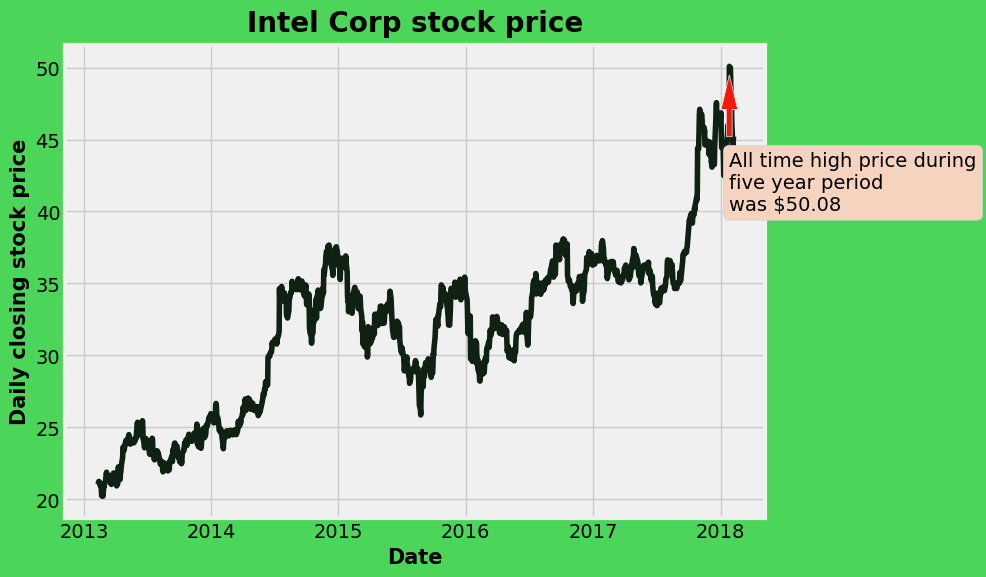

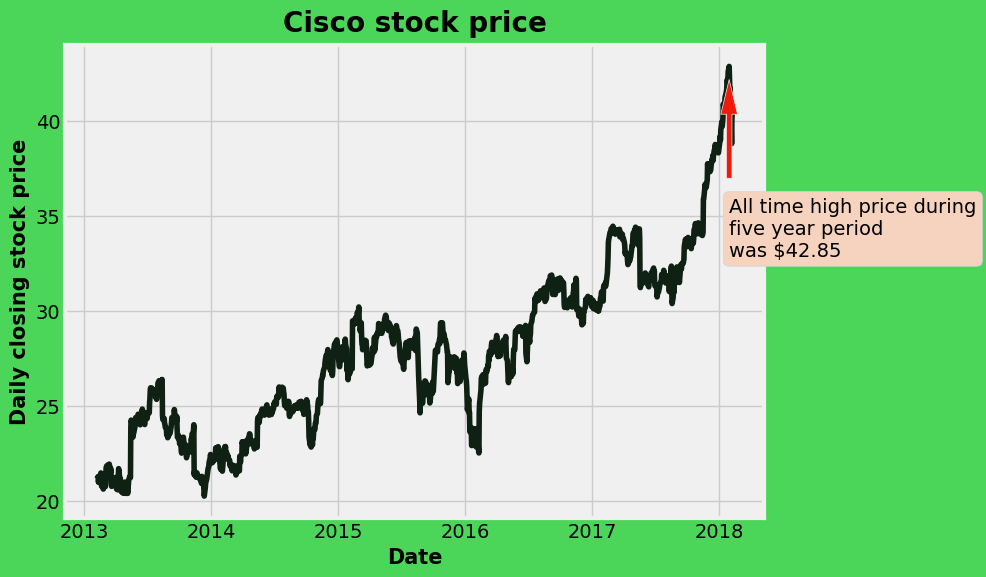

In [11]:
# function return closing stock price over a 5 years of time period
def closing_stock_price(df):

    # define highest stock over 5 period of time with date of the same
    high = df['close'].max()
    datetime = df[df['close'] == df['close'].max()]['date'].values

    if df['ticks'].unique()[0] == 'GE':
        fig, ax = plt.subplots(figsize=(10,6), facecolor='#ed615c')
    elif df['ticks'].unique()[0] == 'F':
        fig, ax = plt.subplots(figsize=(10,6), facecolor='#ed615c')
    else:
        fig, ax = plt.subplots(figsize=(10,6), facecolor='#4bd659')
    ax.plot(df['date'], df['close'], color='#0f2113')
    ax.set_title(f"{df['co_name'].unique()[0]} stock price", fontsize=20)
    ax.set_xlabel("Date", fontsize=15)
    ax.set_ylabel("Daily closing stock price", fontsize=15)
    if df['ticks'].unique()[0] == 'AAPL':
        ax.annotate(f"All time high price during\nfive year period\nwas ${high}", xy=(datetime, high),xytext=(datetime,high-35),
                bbox=dict(boxstyle="round",facecolor='#f5d3bf', edgecolor='#d0d5db'),
                 arrowprops=dict(facecolor='#f0190a',headlength=25, shrink=0.1))
    elif df['ticks'].unique()[0] == 'F':
        ax.annotate(f"All time high price during\nfive year period\nwas ${high}", xy=(datetime, high),xytext=(datetime,high-3),
                bbox=dict(boxstyle="round",facecolor='#f5d3bf', edgecolor='#d0d5db'),
                 arrowprops=dict(facecolor='#f0190a',headlength=25, shrink=0.1))
    elif df['ticks'].unique()[0] == 'FB':
        ax.annotate(f"All time high price during\nfive year period\nwas ${high}", xy=(datetime, high),xytext=(datetime,high-50),
                bbox=dict(boxstyle="round",facecolor='#f5d3bf', edgecolor='#d0d5db'),
                 arrowprops=dict(facecolor='#f0190a',headlength=25, shrink=0.1))
    elif df['ticks'].unique()[0] == 'MSFT':
        ax.annotate(f"All time high price during\nfive year period\nwas ${high}", xy=(datetime, high),xytext=(datetime,high-20),
                bbox=dict(boxstyle="round",facecolor='#f5d3bf', edgecolor='#d0d5db'),
                 arrowprops=dict(facecolor='#f0190a',headlength=25, shrink=0.1))
    elif df['ticks'].unique()[0] == 'MU':
        ax.annotate(f"All time high price during\nfive year period\nwas ${high}", xy=(datetime, high),xytext=(datetime,high-15),
                bbox=dict(boxstyle="round",facecolor='#f5d3bf', edgecolor='#d0d5db'),
                 arrowprops=dict(facecolor='#f0190a',headlength=25, shrink=0.1))
    else:
        ax.annotate(f"All time high price during\nfive year period\nwas ${high}", xy=(datetime, high),xytext=(datetime,high-10),
                bbox=dict(boxstyle="round",facecolor='#f5d3bf', edgecolor='#d0d5db'),
                 arrowprops=dict(facecolor='#f0190a',headlength=25, shrink=0.1))

    plt.show()

# plot of all the closing stocks
closing_stock_price(bac_df)
closing_stock_price(aapl_df)
closing_stock_price(ge_df)
closing_stock_price(f_df)
closing_stock_price(fb_df)
closing_stock_price(msft_df)
closing_stock_price(amd_df)
closing_stock_price(mu_df)
closing_stock_price(intc_df)
closing_stock_price(csco_df)

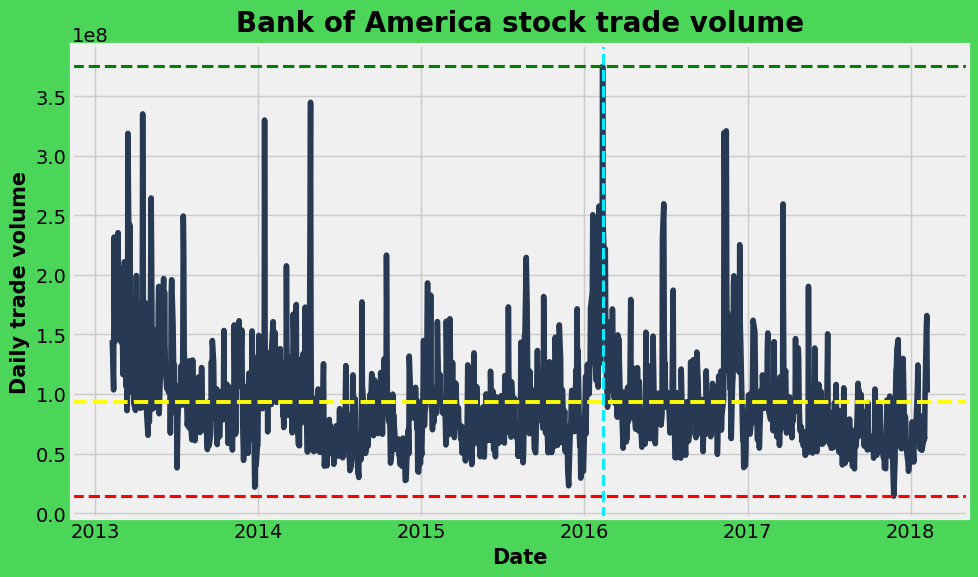

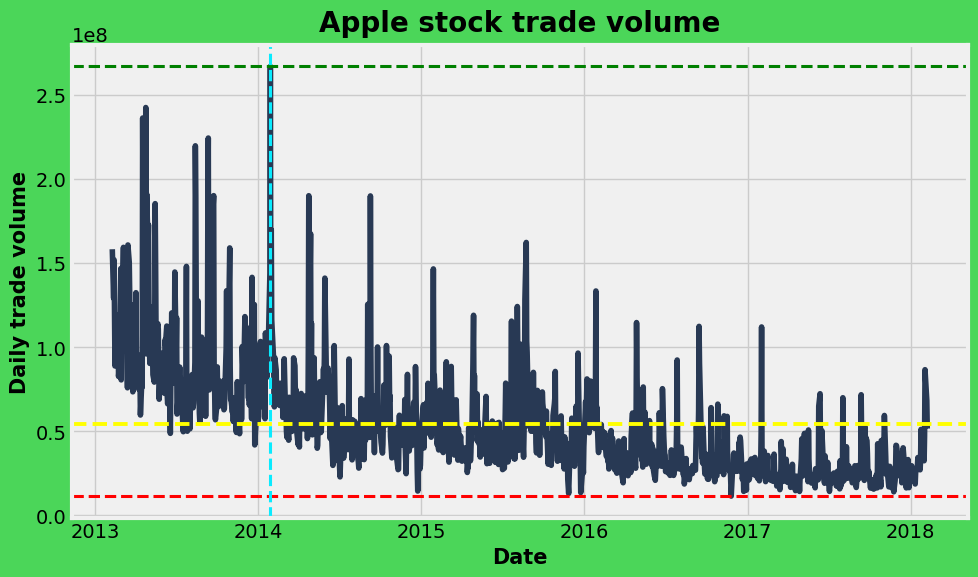

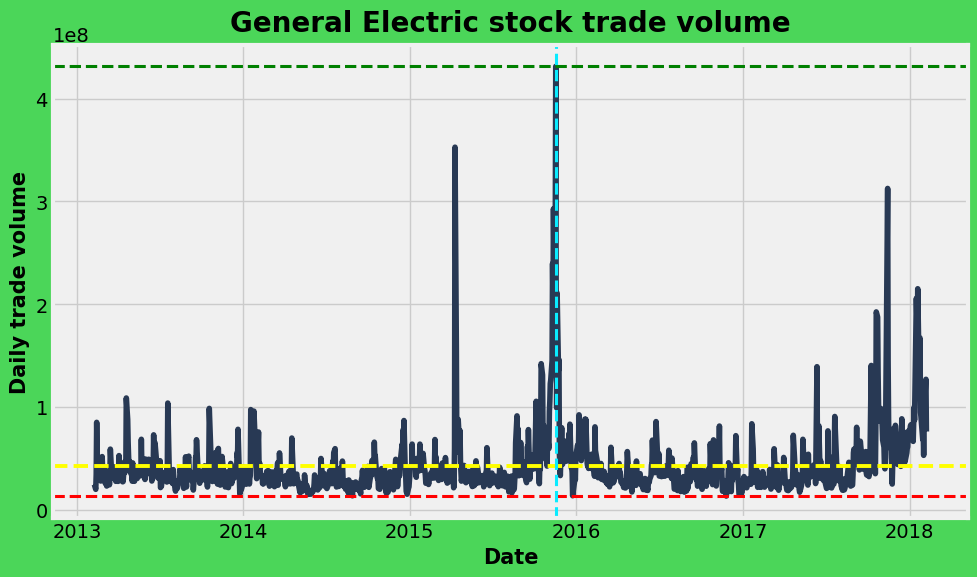

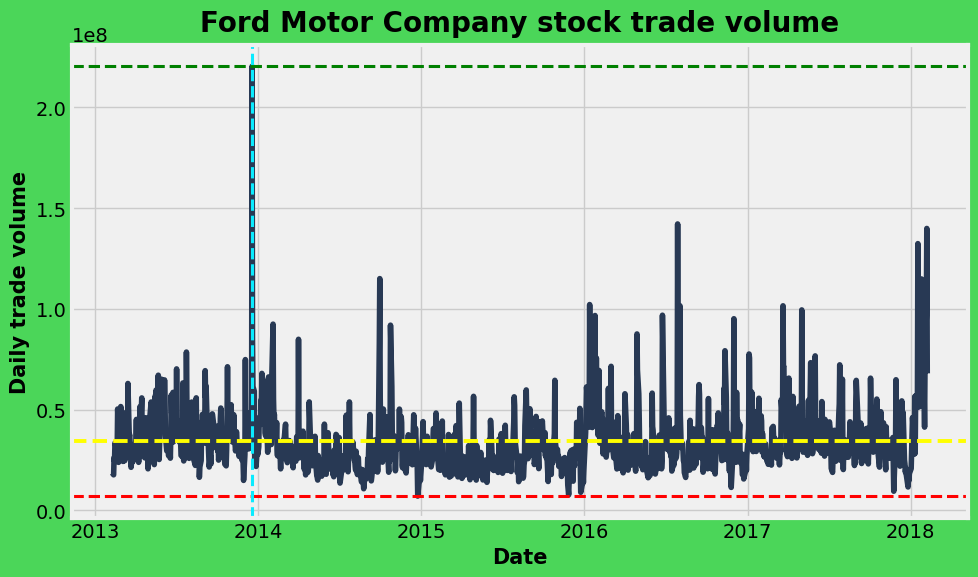

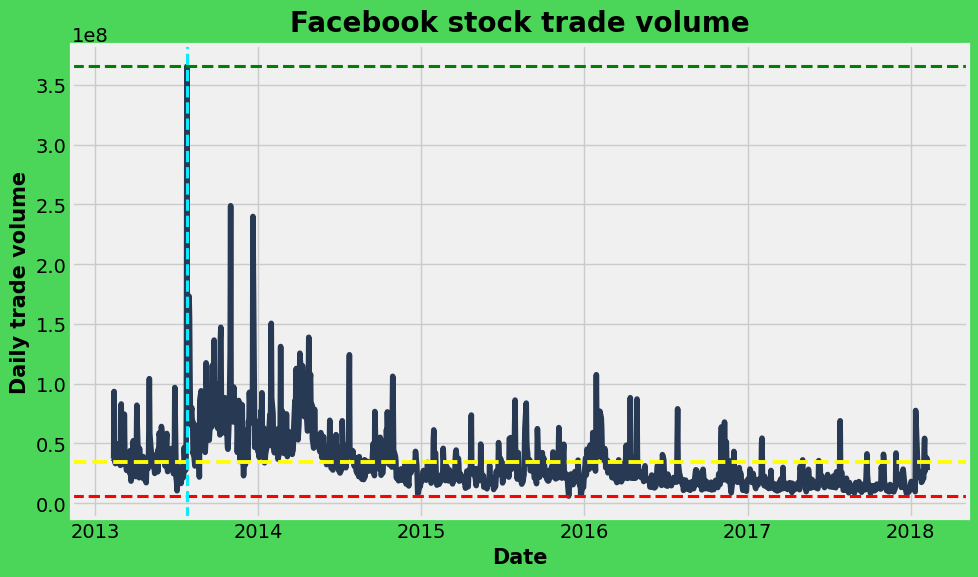

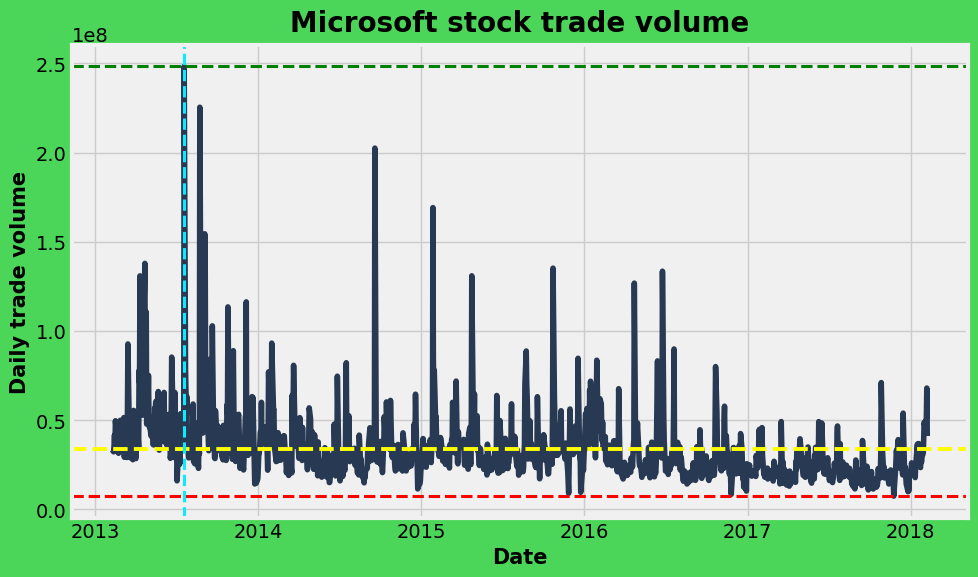

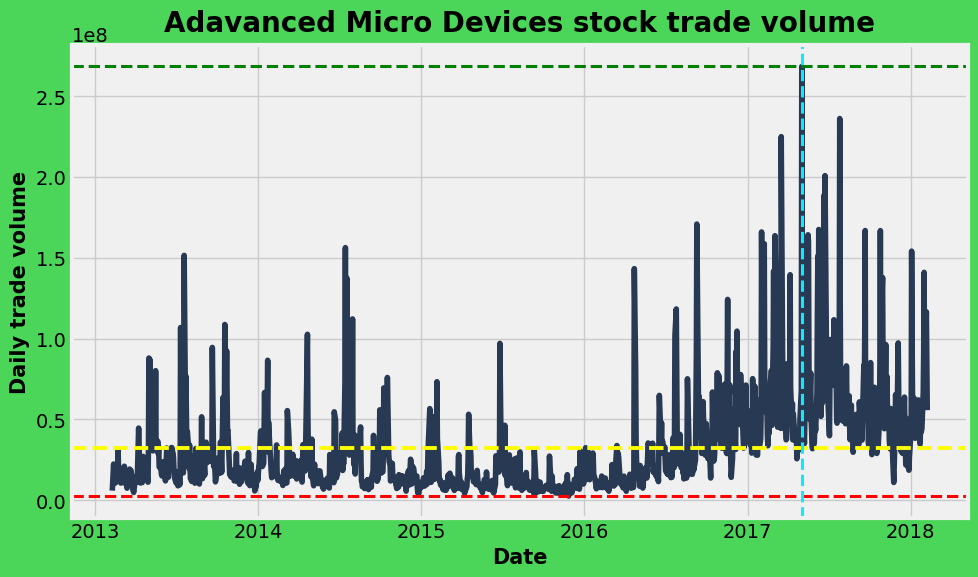

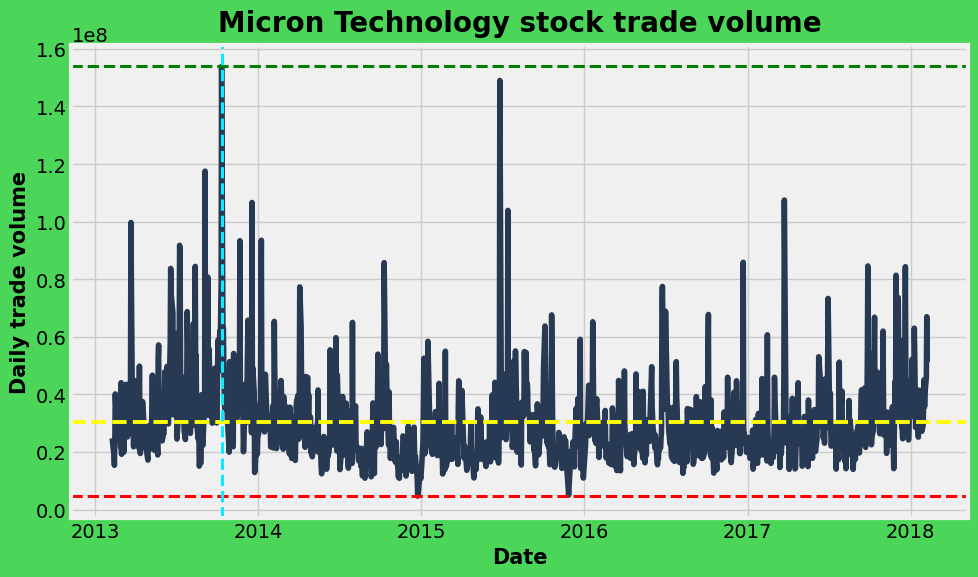

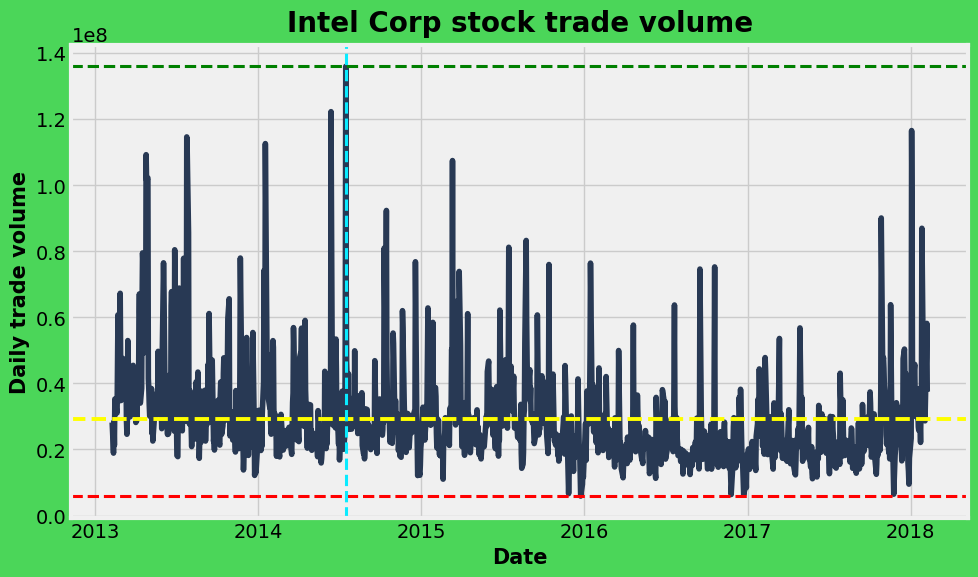

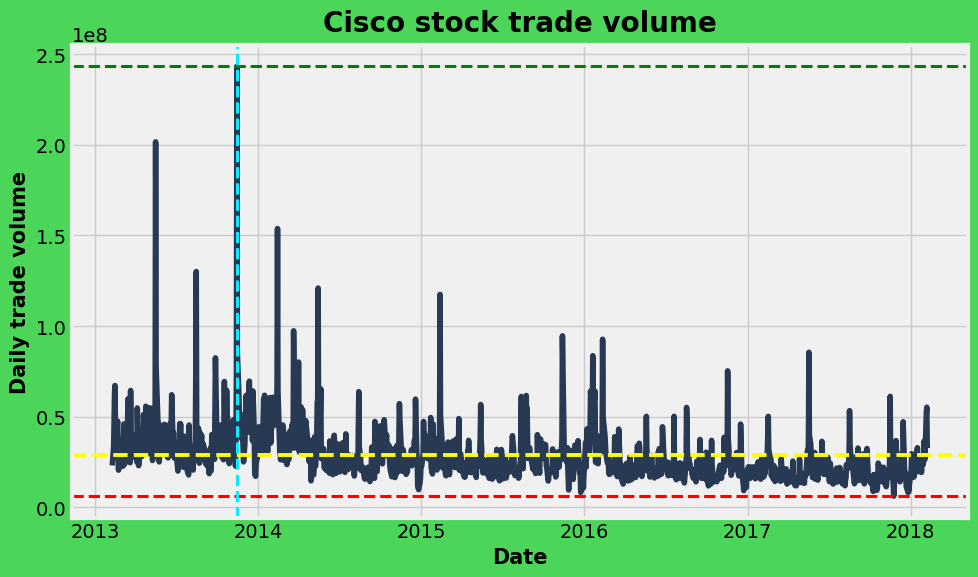

In [12]:
# function to visualize trade volume of stocks
def trade_vol(df):

    # Convert 'date' column to numeric representation for calculating the mean
    # This could be done by converting to days since the epoch or using a different method
    # Here we will convert to days since epoch for demonstration purposes.
    df['date_numeric'] = df['date'].apply(lambda x: x.timestamp()) # converting to numerical using timestamp
    ave_x = df['date_numeric'].mean() # calculating mean of numerical date

    # Remove the date_numeric column as we do not need this anymore
    df.drop(columns=['date_numeric'], inplace=True)

    ave_y = df['volume'].mean()
    # y coord for max trade vol
    max_y = df['volume'].max()
    # y coord for min trade vol
    min_y = df['volume'].min()

    fig, ax = plt.subplots(figsize=(10,6), facecolor='#4bd659')
    ax.plot(df['date'], df['volume'], color='#283954')
    ax.set_title(f"{df['co_name'].unique()[0]} stock trade volume", fontsize=20)
    ax.set_xlabel("Date", fontsize=15)
    ax.set_ylabel("Daily trade volume", fontsize=15)
    ax.axhline(y=df['volume'].max(), linestyle='--', lw=2.2, color='green')
    ax.axhline(y=df['volume'].min(), linestyle='--',lw=2.2, color='red')
    ax.axhline(y=df['volume'].mean(), linestyle='--',lw=2.8, color='yellow')
    ax.axvline(x=df[df['volume'] == max_y]['date'].values, ls='--', lw='2.2', color='#0aebff')
    ax.annotate(f"Average trade volume {round(df['volume'].mean(),2)}",
                xy=(pd.Timestamp(ave_x),ave_y),xytext=(pd.Timestamp(ave_x),ave_y + 10000000),
                bbox=dict(boxstyle="round",facecolor='#e8e0ba', edgecolor='#d0d5db')
                 )
    ax.annotate(f"Maximum trade volume {df['volume'].max()}",
                xy=(pd.Timestamp(ave_x),max_y),xytext=(pd.Timestamp(ave_x),max_y - 1000000),
                bbox=dict(boxstyle="round",facecolor='#e8e0ba', edgecolor='#d0d5db')
                 )
    ax.annotate(f"Minimum trade volume {df['volume'].min()}",
                xy=(pd.Timestamp(ave_x),min_y),xytext=(pd.Timestamp(ave_x),min_y - 1000000),
                bbox=dict(boxstyle="round",facecolor='#e8e0ba', edgecolor='#d0d5db')
                 )

    plt.show()


# plot of all stocks trade volume
trade_vol(bac_df)
trade_vol(aapl_df)
trade_vol(ge_df)
trade_vol(f_df)
trade_vol(fb_df)
trade_vol(msft_df)
trade_vol(amd_df)
trade_vol(mu_df)
trade_vol(intc_df)
trade_vol(csco_df)

Tech stock only, comparison for volatility between stocks(Might need a better graph)

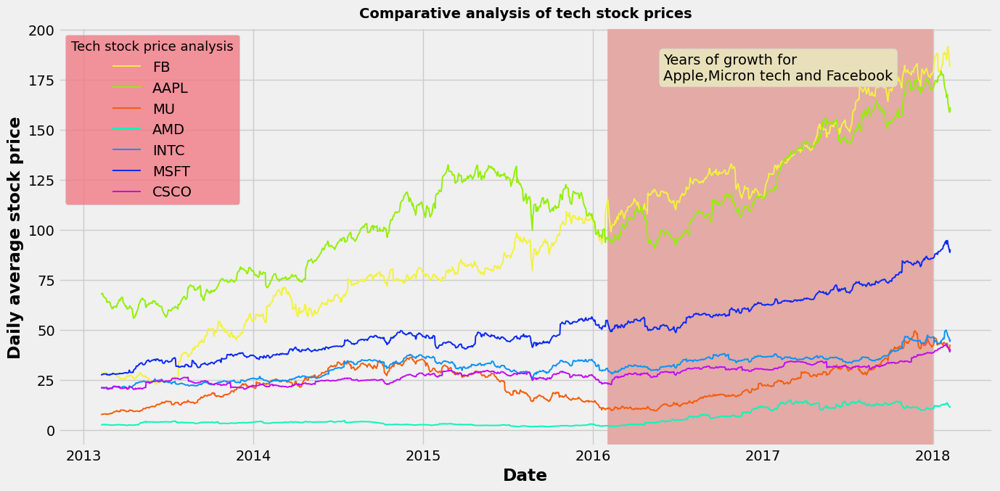

In [13]:
# tech stocks price comparison
fig, ax = plt.subplots(figsize=(14,7))
ax.plot(fb_df['date'], fb_df['daily_mean'],label='FB', color='#f2f23f', lw=1.4)
ax.plot(aapl_df['date'], aapl_df['daily_mean'],label='AAPL', color='#92f005', lw=1.4)
ax.plot(mu_df['date'], mu_df['daily_mean'],label='MU', color='#f55c0a', lw=1.4)
ax.plot(amd_df['date'], amd_df['daily_mean'],label='AMD', color='#0af5ba', lw=1.4)
ax.plot(intc_df['date'], intc_df['daily_mean'],label='INTC', color='#0a93f5', lw=1.4)
ax.plot(msft_df['date'], msft_df['daily_mean'],label='MSFT', color='#0a29f5', lw=1.4)
ax.plot(csco_df['date'], csco_df['daily_mean'],label='CSCO', color='#c20af5', lw=1.4)
ax.axvspan(*mdates.datestr2num(['2/1/2016','12/31/2017']), color='#e3aaa6')
ax.set_title("Comparative analysis of tech stock prices")
ax.annotate("Years of growth for\nApple,Micron tech and Facebook", xy=(mdates.datestr2num('6/1/2016'),175),
           bbox=dict(boxstyle="round",facecolor='#e8e0ba', edgecolor='#d0d5db'))
ax.set_xlabel("Date")
ax.set_ylabel("Daily average stock price")
ax.legend(facecolor='#f27985', fontsize="medium", title="Tech stock price analysis", title_fontsize=13)

plt.show()

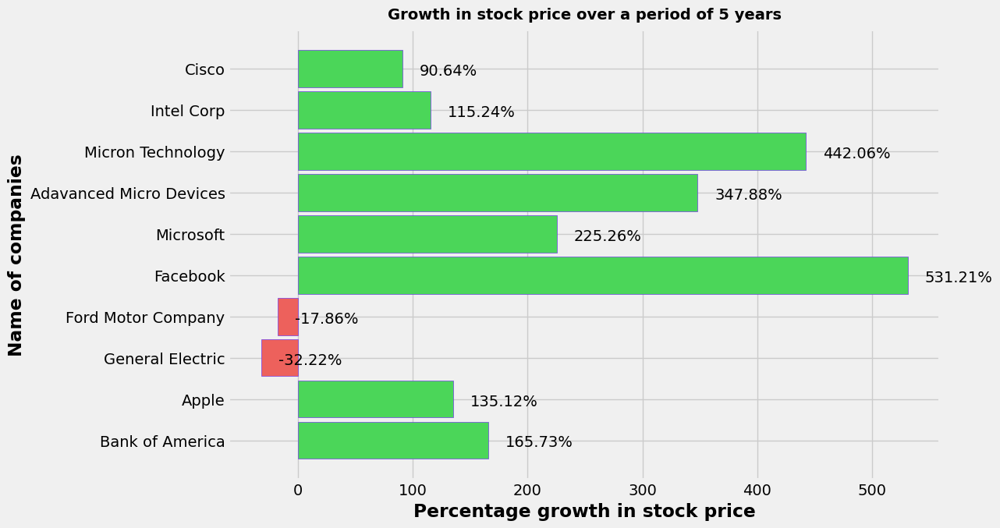

In [14]:
# list of stock dataframes
list_df = [bac_df, aapl_df, ge_df, f_df, fb_df, msft_df, amd_df, mu_df, intc_df, csco_df]

# loop through the the list_df to find mini and maxi of each stocks
mini = [df[df['date'] == df['date'].min()]['close'].values.item() for df in list_df]
maxi = [df[df['date'] == df['date'].max()]['close'].values.item() for df in list_df]

# find list of abosolute difference between both stock price
diff = np.array(maxi) - np.array(mini)

# find the percentage growth
growth = (diff/mini)*100
growth_list = growth.tolist()
co_name_list = [df['co_name'].unique()[0] for df in list_df]

# visualize the growth of the stocks
fig, ax = plt.subplots(figsize=(13,7))
ax.barh(y=co_name_list, width=growth_list, height=0.9, color=['#4bd659','#4bd659','#ed615c','#ed615c','#4bd659',
                                                             '#4bd659','#4bd659','#4bd659','#4bd659','#4bd659'],
       edgecolor='#713ae8')
for p in ax.patches:
    ax.annotate(f'{round(p.get_width(),2)}%', (p.get_width()+15, p.get_y() +0.3))
ax.set_xlabel('Percentage growth in stock price')
ax.set_ylabel('Name of companies')
ax.set_title("Growth in stock price over a period of 5 years")
plt.show()

In [15]:
# python's scipy.stats module has ttest_1samp method we allows to prove this hypothesis
result_dict = {}
for df in list_df:
    result = stats.ttest_1samp(df['daily return'], 0)
    result_dict[df['ticks'].unique()[0]] = result
result_dict

{'BAC': TtestResult(statistic=-0.3532776176429947, pvalue=0.7239395130534507, df=1258),
 'AAPL': TtestResult(statistic=0.41429430560560776, pvalue=0.6787292124343913, df=1258),
 'GE': TtestResult(statistic=-0.6899014787481074, pvalue=0.4903833915917716, df=1258),
 'F': TtestResult(statistic=-1.829967497402379, pvalue=0.06749132535767648, df=1258),
 'FB': TtestResult(statistic=0.43179923117451596, pvalue=0.6659613318143065, df=1258),
 'MSFT': TtestResult(statistic=2.936864998172622, pvalue=0.00337582087561039, df=1258),
 'AMD': TtestResult(statistic=0.5320769266138293, pvalue=0.5947666691710993, df=1258),
 'MU': TtestResult(statistic=-0.3912233565721498, pvalue=0.6956983959552626, df=1258),
 'INTC': TtestResult(statistic=3.0472693720373076, pvalue=0.002357434011831407, df=1258),
 'CSCO': TtestResult(statistic=2.6892871186777536, pvalue=0.007255138945761972, df=1258)}

daily return hypothesis
 H0 = daily return is zero
 H1 = daily return is not zero

 Proving this hypothesis, if p-value is greater than 0.05 then we can't reject the null hypothesis, and the other way around

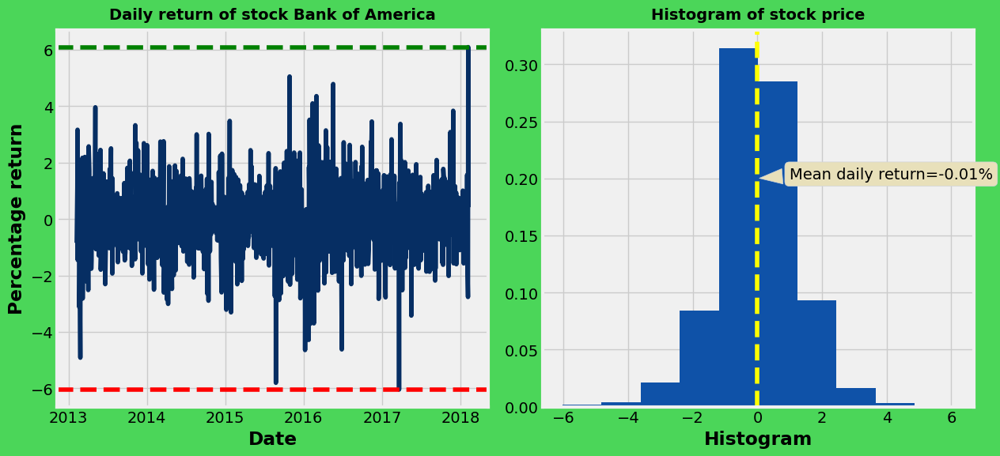

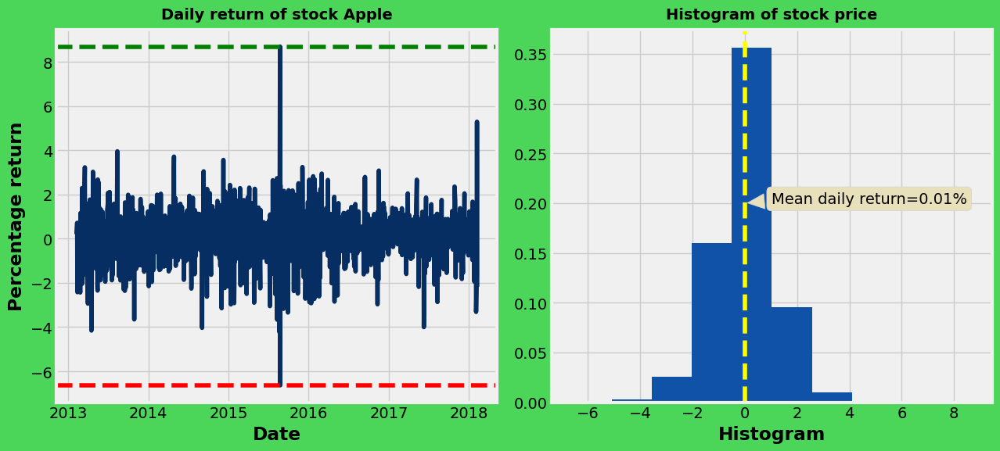

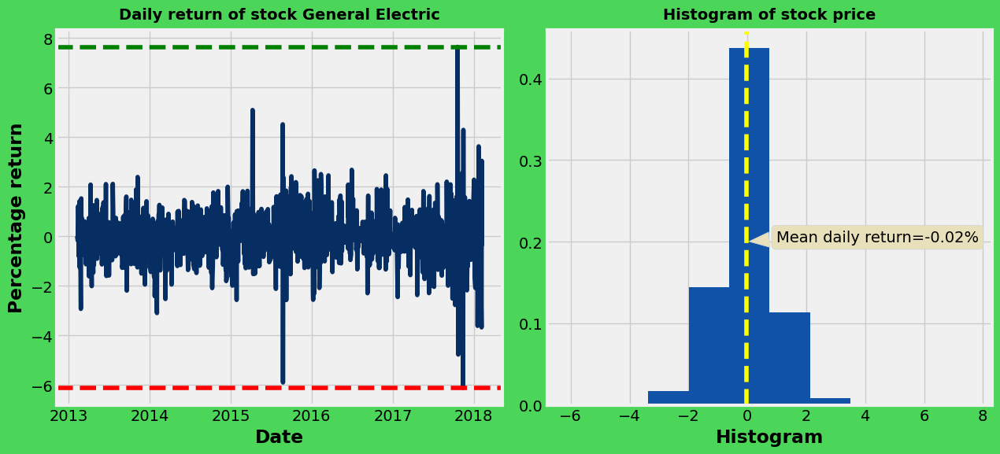

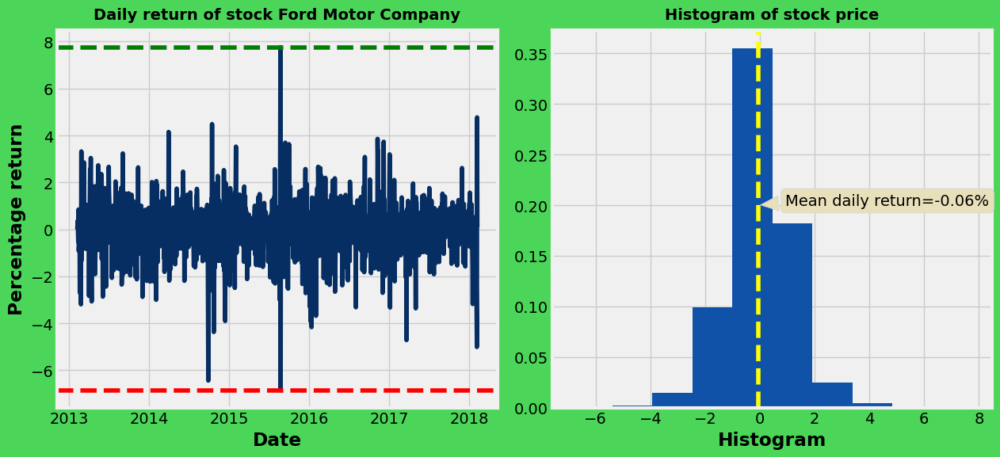

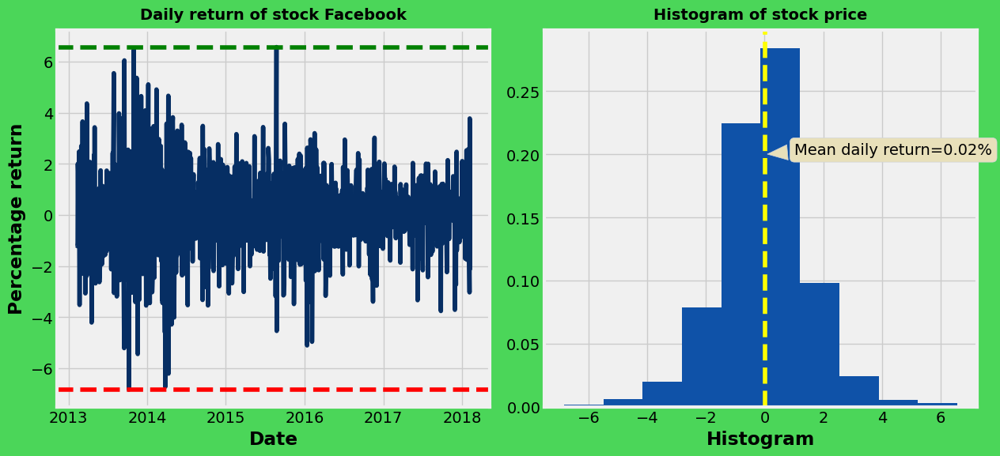

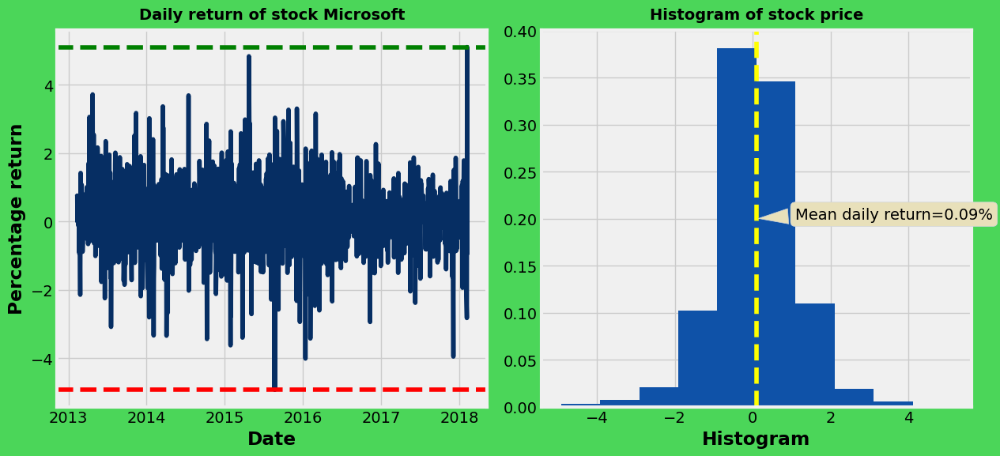

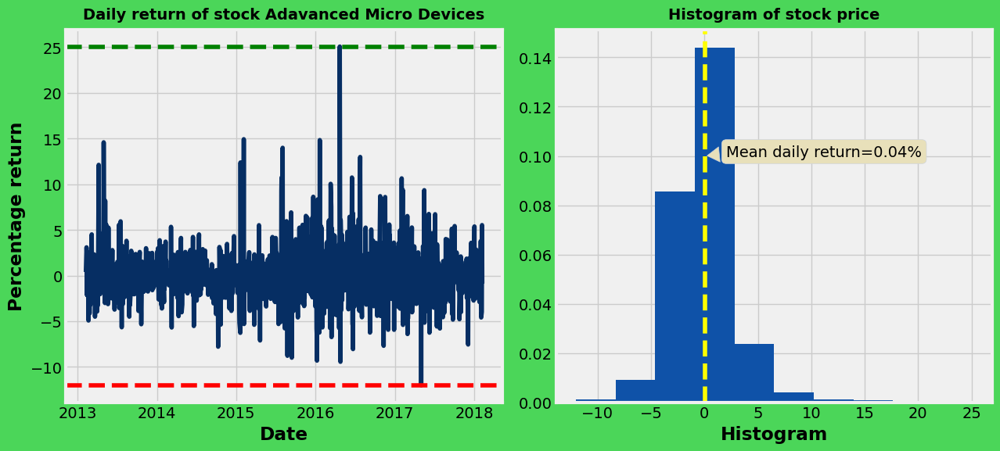

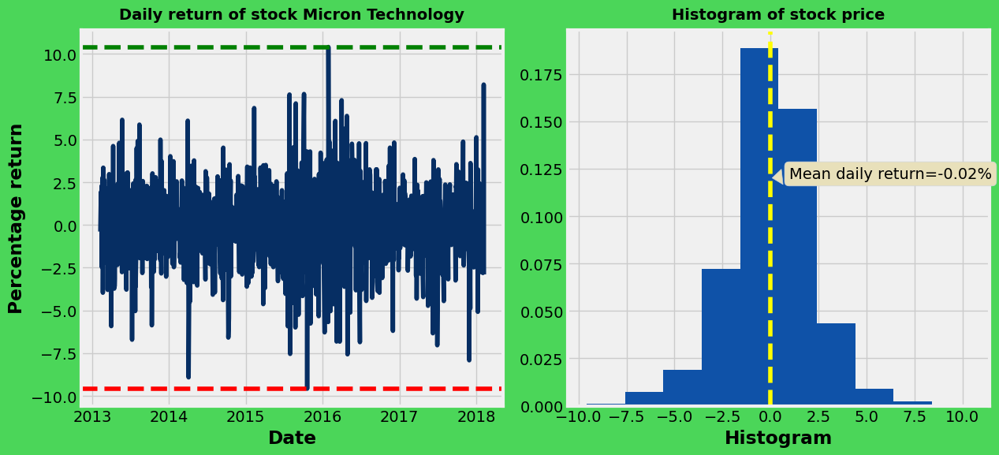

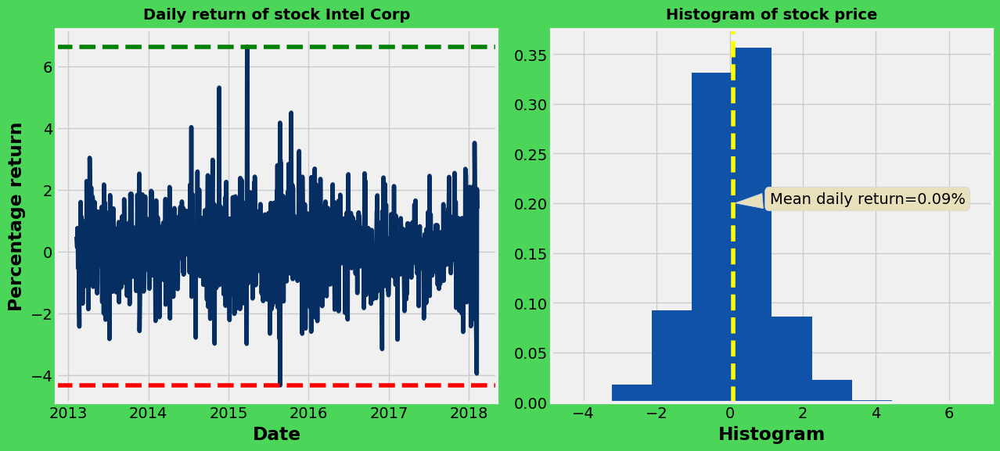

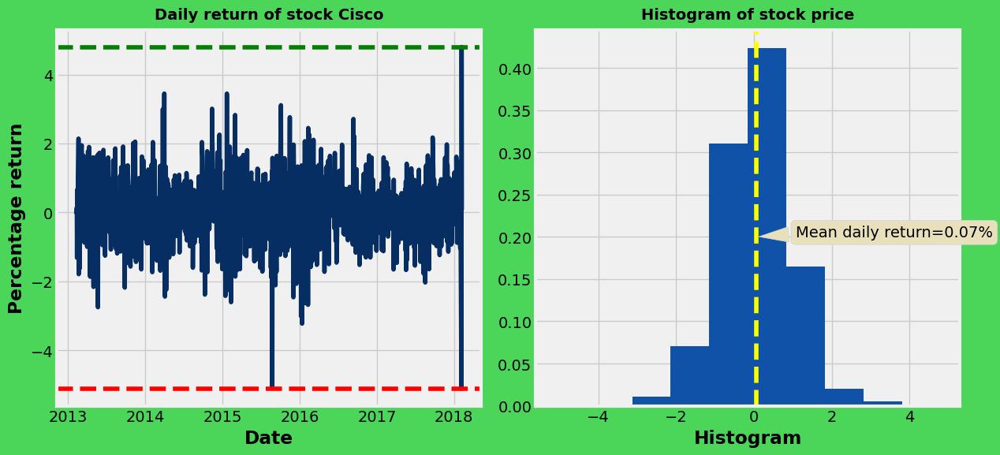

In [16]:
###### function to plot daily return and histogram of 10 stocks
def daily_return(df):

    # assign variables to annotation positions
    # Convert 'date' column to numeric representation for calculating the mean
    # This could be done by converting to days since the epoch or using a different method
    # Here we will convert to days since epoch for demonstration purposes.
    df['date_numeric'] = df['date'].apply(lambda x: x.timestamp()) # converting to numerical using timestamp
    ave_x = df['date_numeric'].mean() # calculating mean of numerical date

    # Remove the date_numeric column as we do not need this anymore
    df.drop(columns=['date_numeric'], inplace=True)

    y_max = df['daily return'].max()
    y_max_date = df[df['daily return'] == df['daily return'].max()]['date'].values
    # The following line was changed to directly extract the date
    # using .item() and .date() without string conversion
    xb = y_max_date.item().date()
    y_min = df['daily return'].min()
    y_mean = df['daily return'].mean()

    plt.figure(figsize=(13,6), facecolor='#4bd659')

    plt.subplot(121)
    plt.plot(df['date'], df['daily return'], color='#062e63')
    plt.axhline(y=df['daily return'].max(), color='green', ls='--')
    plt.axhline(y=df['daily return'].min(), color='red', ls='--')
    plt.xlabel('Date')
    plt.ylabel("Percentage return")
    plt.annotate(f"Min. daily return={round(df['daily return'].min(),2)}%",
                xy=(pd.Timestamp(ave_x),y_min),xytext=(pd.Timestamp(ave_x),y_min),
                bbox=dict(boxstyle="round",facecolor='#e8e0ba', edgecolor='#d0d5db')
                 )
    plt.annotate(f"Max. daily return={round(df['daily return'].max(),2)}%\nDate was={xb}",
                xy=(pd.Timestamp(ave_x),y_max),xytext=(pd.Timestamp(ave_x),y_max-0.6),
                bbox=dict(boxstyle="round",facecolor='#e8e0ba', edgecolor='#d0d5db', alpha=0.7)
                 )
    plt.title(f"Daily return of stock {df['co_name'].unique()[0]}")

    plt.subplot(122)
    plt.hist(df['daily return'], density=True, color='#0f52a8')
    plt.xlabel('Histogram')
    plt.axvline(x=df['daily return'].mean(), color='yellow', ls='--')
    if df['ticks'].unique()[0] == 'AMD':
        plt.annotate(f"Mean daily return={round(df['daily return'].mean(),2)}%",
                xy=(y_mean,0.10),xytext=(y_mean+2,0.10),
                bbox=dict(boxstyle="round",facecolor='#e8e0ba', edgecolor='#d0d5db'),
                arrowprops=dict(arrowstyle="wedge,tail_width=1.",facecolor='#e8e0ba',
                            edgecolor='#d0d5db',
                            relpos=(0.1,0.5)
                            )
                 )
    elif df['ticks'].unique()[0] == 'MU':
        plt.annotate(f"Mean daily return={round(df['daily return'].mean(),2)}%",
                xy=(y_mean,0.12),xytext=(y_mean+1,0.12),
                bbox=dict(boxstyle="round",facecolor='#e8e0ba', edgecolor='#d0d5db'),
                arrowprops=dict(arrowstyle="wedge,tail_width=1.",facecolor='#e8e0ba',
                            edgecolor='#d0d5db',
                            relpos=(0.1,0.5)
                            )
                 )
    else:
        plt.annotate(f"Mean daily return={round(df['daily return'].mean(),2)}%",
                xy=(y_mean,0.20),xytext=(y_mean+1,0.20),
                bbox=dict(boxstyle="round",facecolor='#e8e0ba', edgecolor='#d0d5db'),
                arrowprops=dict(arrowstyle="wedge,tail_width=1.",facecolor='#e8e0ba',
                            edgecolor='#d0d5db',
                            relpos=(0.1,0.5)
                            )
                 )
    plt.title(f"Histogram of stock price")

    plt.show()

# call the function with dataframe
daily_return(bac_df)
daily_return(aapl_df)
daily_return(ge_df)
daily_return(f_df)
daily_return(fb_df)
daily_return(msft_df)
daily_return(amd_df)
daily_return(mu_df)
daily_return(intc_df)
daily_return(csco_df)

In [17]:
# using plotly graph_objs let's plot candlestick charts of stocks
def candlestick_chart(df):
    trace = go.Candlestick(x=df['date'],
                          open=df['open'],
                          high=df['high'],
                          low=df['low'],
                          close=df['close'])
    layout ={
    'title': f"{df['co_name'].unique()[0]} Historical Stock Price",
    'xaxis': {'title': 'Date'
             },
    'yaxis': {'title': 'Stock Price (USD$)'}
}


    data = [trace]

    fig = go.Figure(data=data, layout=layout)
    fig.update_layout(xaxis_rangeslider_visible=False, paper_bgcolor='#4bd659')
    fig.show()

# plot the charts using this function
candlestick_chart(bac_df)
candlestick_chart(aapl_df)
candlestick_chart(ge_df)
candlestick_chart(f_df)
candlestick_chart(fb_df)
candlestick_chart(msft_df)
candlestick_chart(amd_df)
candlestick_chart(mu_df)
candlestick_chart(intc_df)
candlestick_chart(csco_df)

In [18]:
# define function to return copies of stock dataframe with moving averages
def mav_function(df):

    # calclulate moving averages of 10,50 and 200 days
    df['10_d_avg'] = df['close'].rolling(window=10).mean()
    df['50_d_avg'] = df['close'].rolling(window=50).mean()
    df['200_d_avg'] = df['close'].rolling(window=200).mean()

    return df

# let's analyse apple and facebook stocks using moving averages methods
aapl_df = mav_function(aapl_df)
fb_df = mav_function(fb_df)

In [19]:
# plot moving avearges charts of apple and facebook
aapl_dfn = aapl_df.copy()
fb_dfn = fb_df.copy()

def mav_chart(df):
    df = df.set_index('date')

    fig = tls.make_subplots(rows=2, cols=1, shared_xaxes=True)
    # set colors and cols names to be plotted
    colors = ['#ff4500', '#92a1cf', '#6E6E6E']
    avgs = ['10_d_avg','50_d_avg','200_d_avg']

    for col, c in zip(avgs, colors):
        fig.append_trace({'x': df.index, 'y': df[col], 'type': 'scatter', 'name': col, 'line': {'color': c}},1,1)
    for col in ['close']:
        fig.append_trace({'x': df.index, 'y': df[col], 'type': 'scatter', 'name': 'closing price', 'line': {'color': '#393f5e'}},2,1)

    fig['layout'].update(height=800,title=f"Relationship between Moving averages <br> and Closing Price of {df['co_name'].unique()[0]}",
                    paper_bgcolor='#4bd659', plot_bgcolor='#F2DFCE')
    fig.show()

In [20]:
mav_chart(fb_dfn)

Prophet forcasting model tes

Step 1: Data Formatting

The df_formatting function is used to prepare the data for Prophet.
It selects the 'date' and 'close' columns from the original AAPL dataframe (aapl_df).
It renames the columns to 'ds' (datestamp) and 'y' (target variable), which are the required column names for Prophet.

Step 2: Model Initialization and Fitting

Inside the price_forecasting function, a Prophet model is initialized with yearly_seasonality = 'auto'. This enables the model to automatically detect yearly seasonality in the data.
The model is then fitted to the formatted AAPL data (aaplph_df) using prophet.fit.

Step 3: Forecasting

A future dataframe is created using prophet.make_future_dataframe with a specified period (365 days in this case). This dataframe extends the dates into the future for which we want to make predictions.
The prophet.predict function is used to generate forecasts based on the fitted model and the future dataframe. This produces a dataframe containing predicted values ('yhat'), along with upper and lower confidence intervals ('yhat_upper', 'yhat_lower').

Step 4: Visualization

The prophet.plot function is used to create a plot of the forecasts, showing the actual data, predicted values, and confidence intervals.
The add_changepoints_to_plot function is used to highlight potential changepoints in the trend of the data.
The prophet.plot_components function is used to visualize the different components of the forecast, such as trend, seasonality, and holidays.

It's only useful with normal economic situation, it will need extra parameter and specific tuning for each situation which tbh kinda dumb that I can't make it better in forecasting but wth who cares


In [21]:
# create function to return dataframe for forecating
def df_formatting(df):

    if 'ds' in df.columns and 'y' in df.columns:
      return df
    df = df.loc[:, ['date','close']]
    df.rename(columns={'date':'ds', 'close':'y'}, inplace=True)

    return df

bacph_df = df_formatting(bac_df)
geph_df = df_formatting(ge_df)
fph_df = df_formatting(f_df)
aaplph_df = df_formatting(aapl_df)
fbph_df = df_formatting(fb_df)
msftph_df = df_formatting(msft_df)
amdph_df = df_formatting(amd_df)
intcph_df = df_formatting(intc_df)
cscoph_df = df_formatting(csco_df)
muph_df = df_formatting(mu_df)

In [22]:
# forecasting using prophet
def price_forecasting(df, period):

    prophet = Prophet(yearly_seasonality = 'auto')
    prophet.fit(df)
    future_price = prophet.make_future_dataframe(periods=period)
    forecasts = prophet.predict(future_price)
    forecast = forecasts[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

    # plot the foreasts
    fig = prophet.plot(forecasts)
    a = add_changepoints_to_plot(fig.gca(), prophet, forecasts)

    # plot the components
    fig2 = prophet.plot_components(forecasts)

    return forecasts

Addition of feature engineering(WIP)

Probably gonna scrap later

In [23]:
#sp500_df = pd.read_csv('all_stocks_5yr.csv', index_col='date', parse_dates=True)

#aaplph_df['ds'] = pd.to_datetime(aaplph_df['ds'])

#aaplph_df = pd.merge(aaplph_df, sp500_df['close'], left_on='ds', right_index=True, how='left')

#aaplph_df.rename(columns={'close': 'sp500'}, inplace=True)

In [24]:
#model = Prophet(yearly_seasonality='auto')
#model.add_regressor('sp500')
#forecast_aapl = price_forecasting(aaplph_df, 365)

06:36:45 - cmdstanpy - INFO - Chain [1] start processing
06:36:46 - cmdstanpy - INFO - Chain [1] done processing


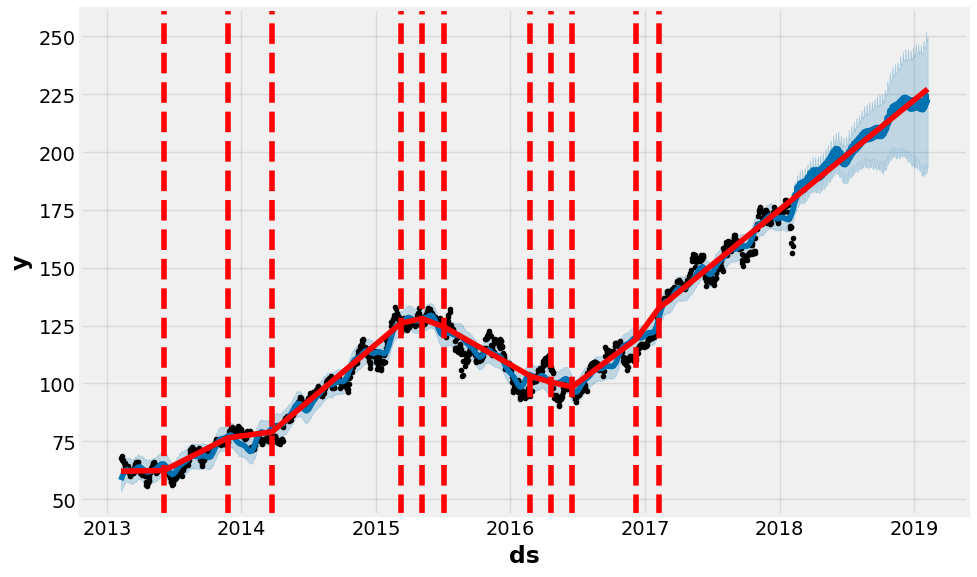

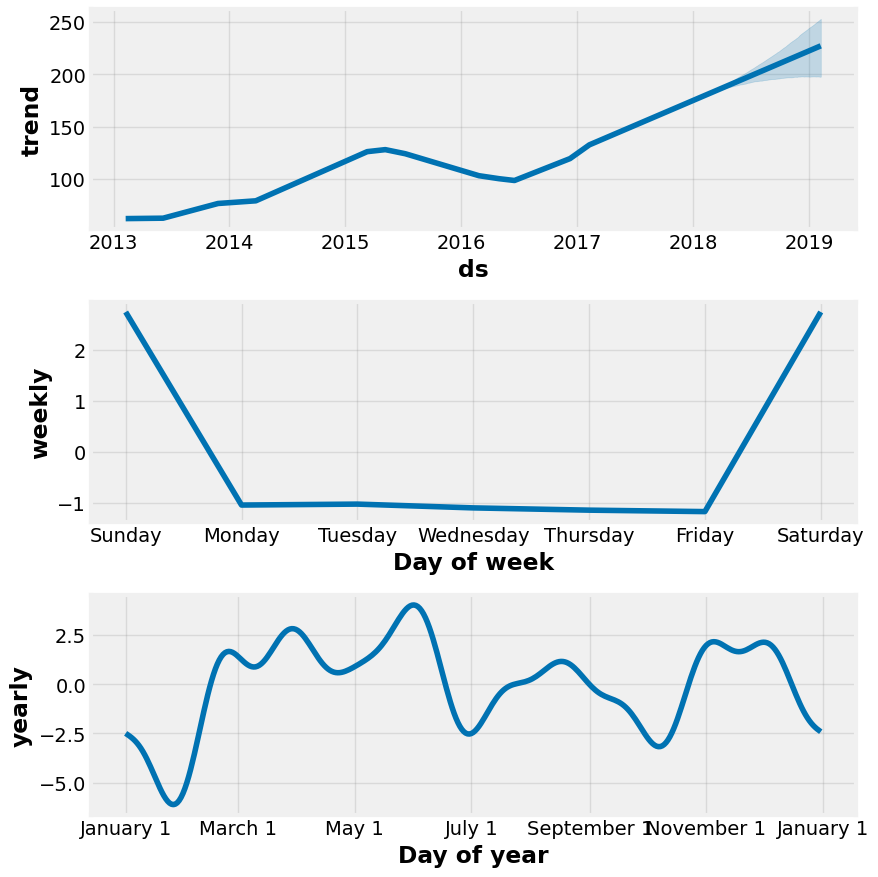

In [25]:
forecast_aapl = price_forecasting(aaplph_df, 365)

06:36:46 - cmdstanpy - INFO - Chain [1] start processing
06:36:46 - cmdstanpy - INFO - Chain [1] done processing


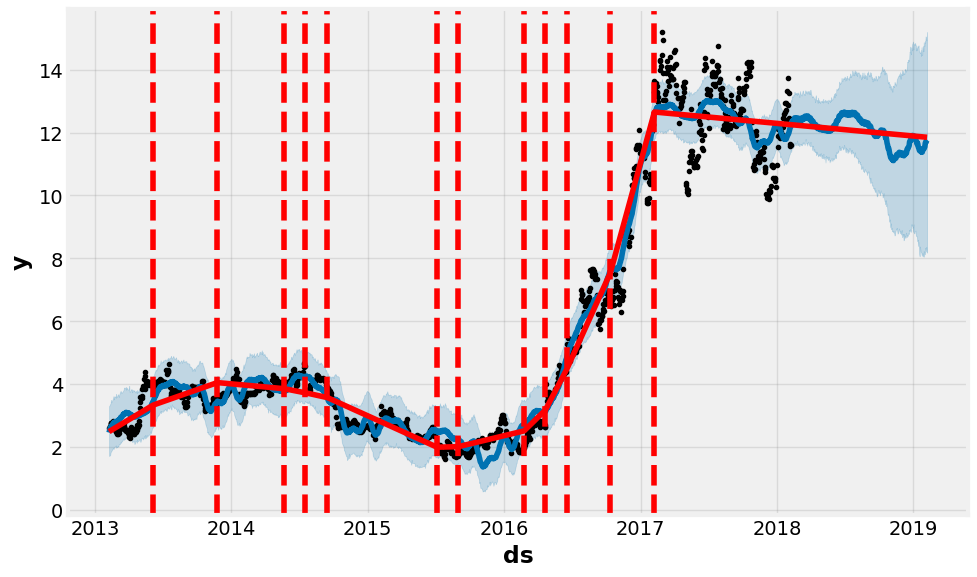

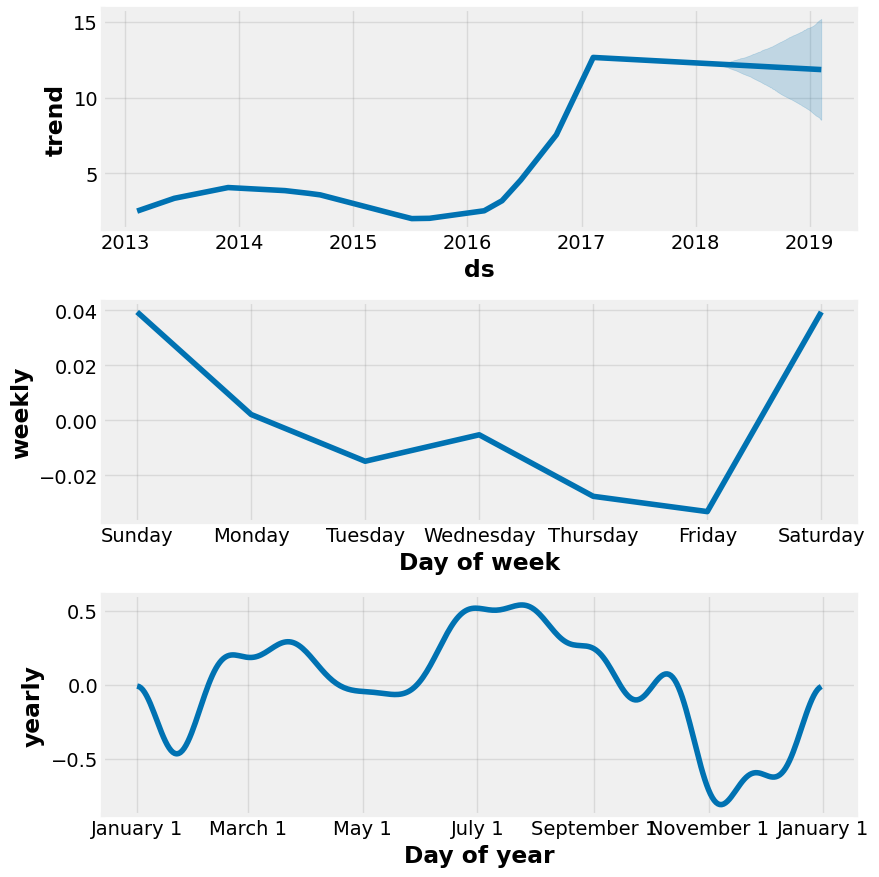

In [26]:
forecast_amd = price_forecasting(amdph_df, 365)

06:36:47 - cmdstanpy - INFO - Chain [1] start processing
06:36:47 - cmdstanpy - INFO - Chain [1] done processing


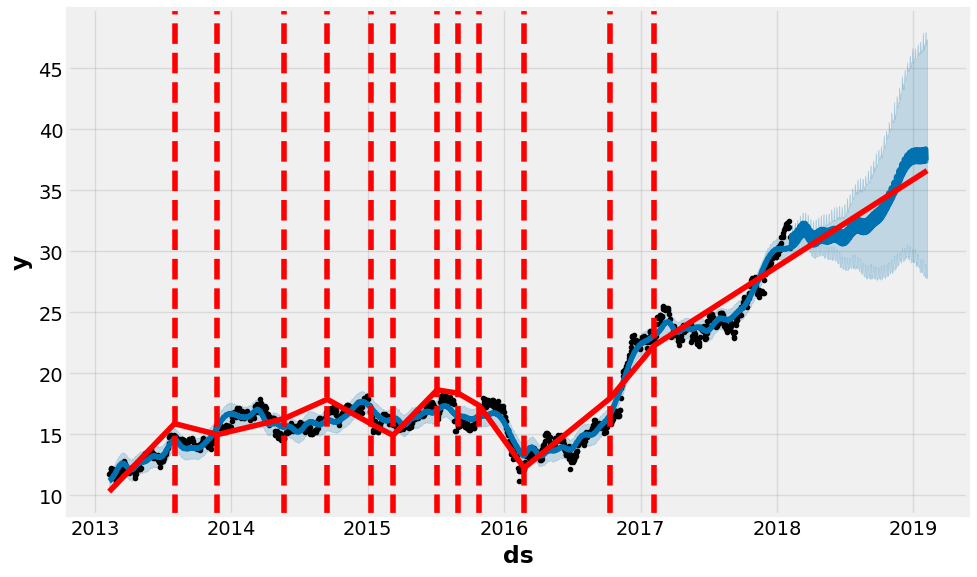

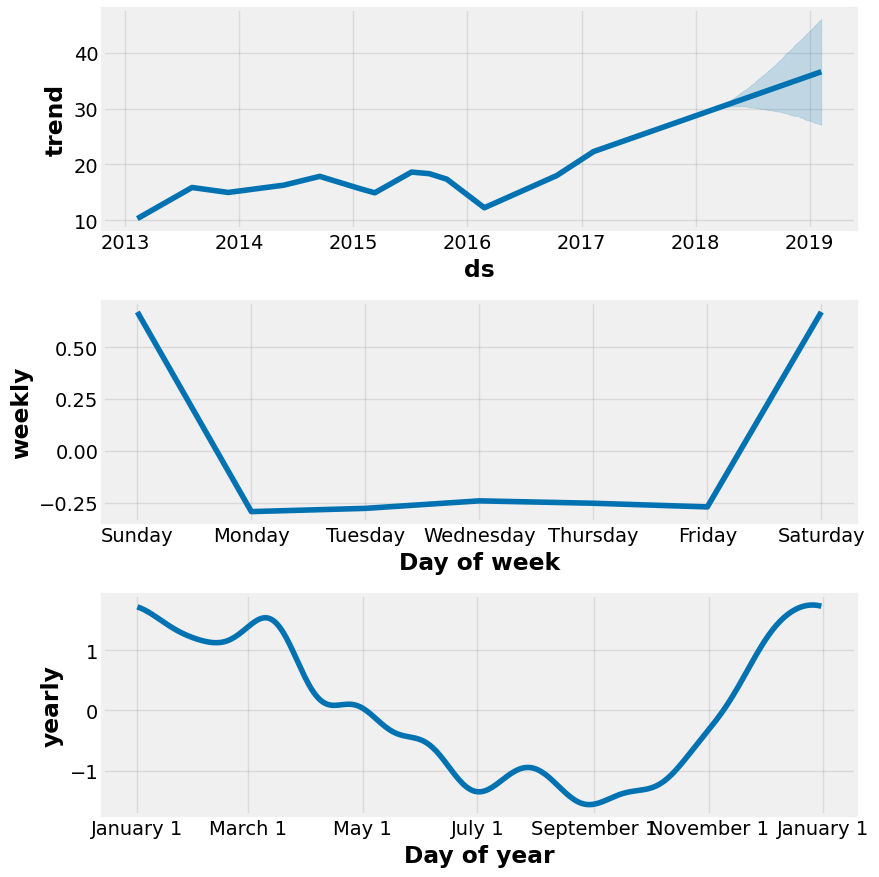

In [27]:
forecast_bac = price_forecasting(bacph_df, 365)

06:38:21 - cmdstanpy - INFO - Chain [1] start processing
06:38:22 - cmdstanpy - INFO - Chain [1] done processing


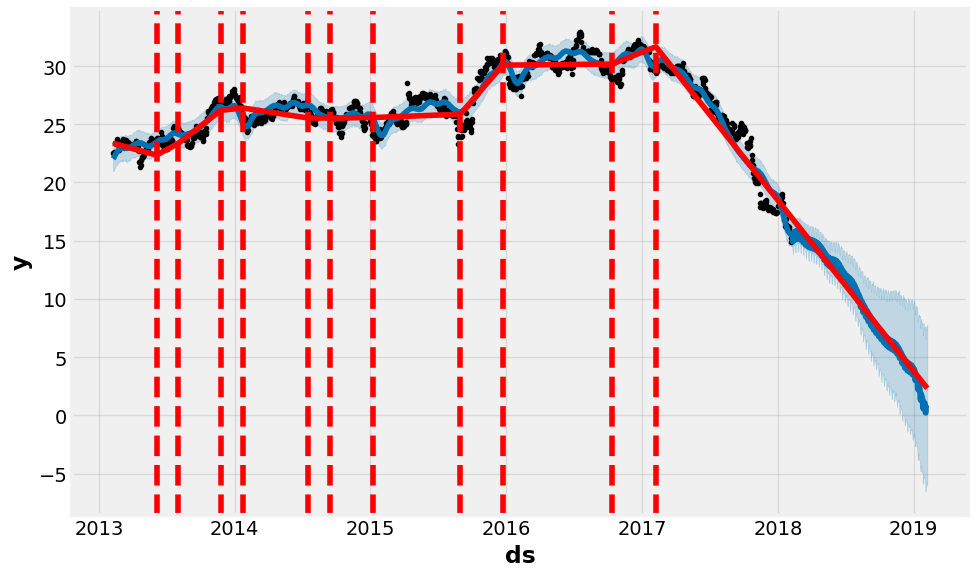

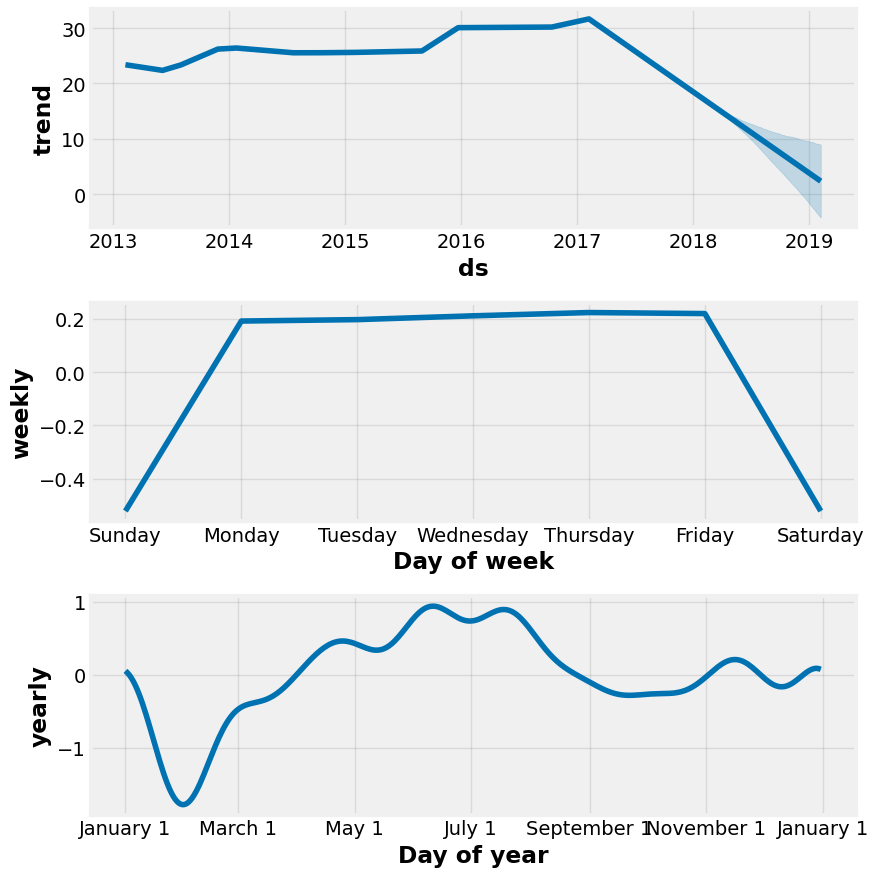

In [38]:
forecast_ge = price_forecasting(geph_df, 365)

06:38:44 - cmdstanpy - INFO - Chain [1] start processing
06:38:44 - cmdstanpy - INFO - Chain [1] done processing


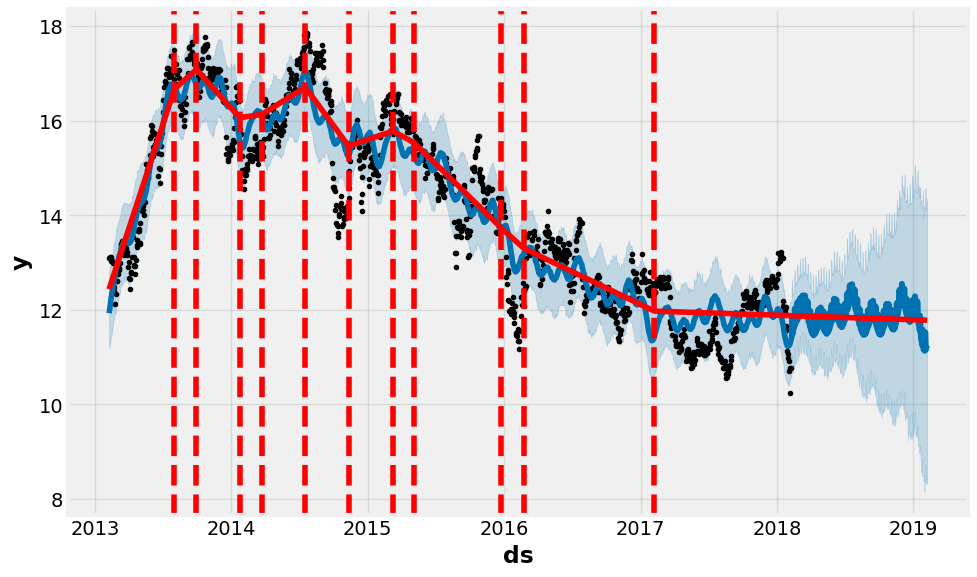

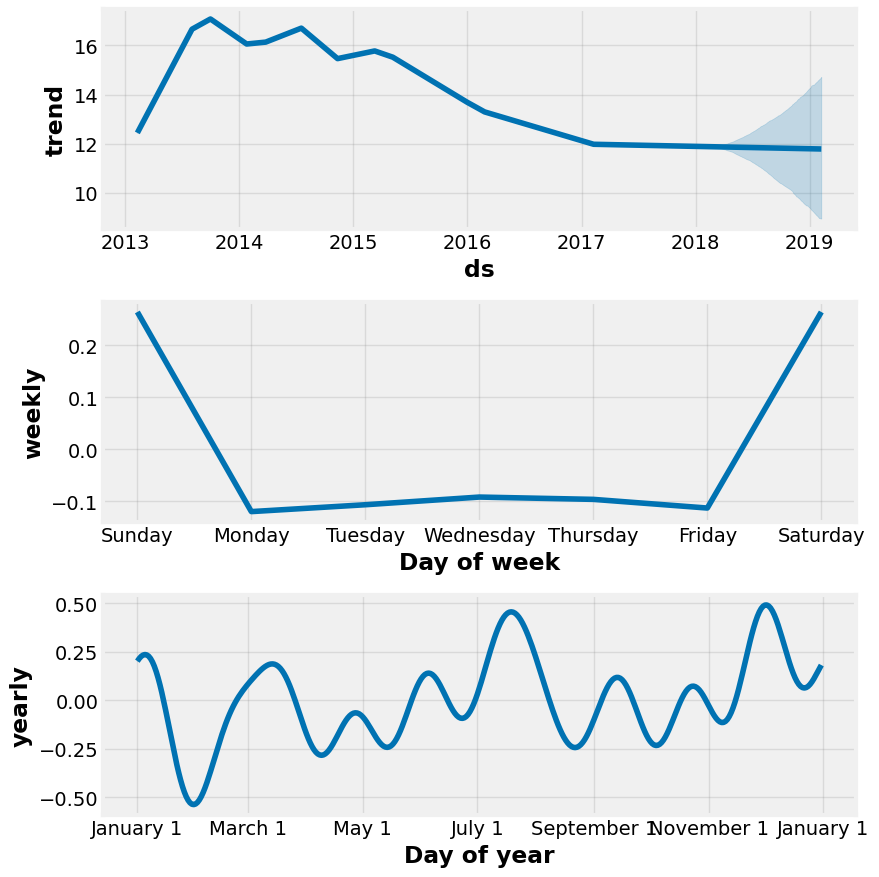

In [39]:
forecast_f = price_forecasting(fph_df, 365)

06:39:04 - cmdstanpy - INFO - Chain [1] start processing
06:39:04 - cmdstanpy - INFO - Chain [1] done processing


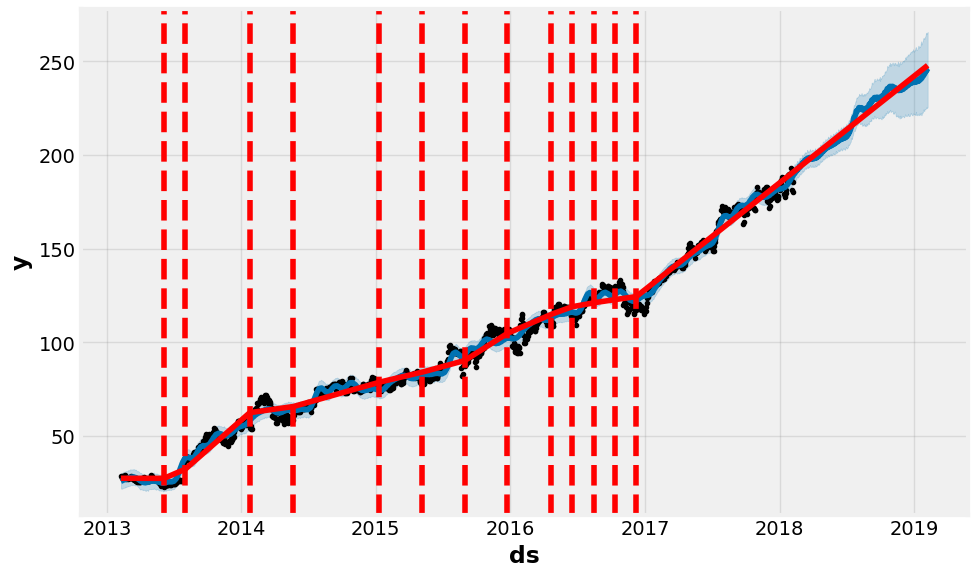

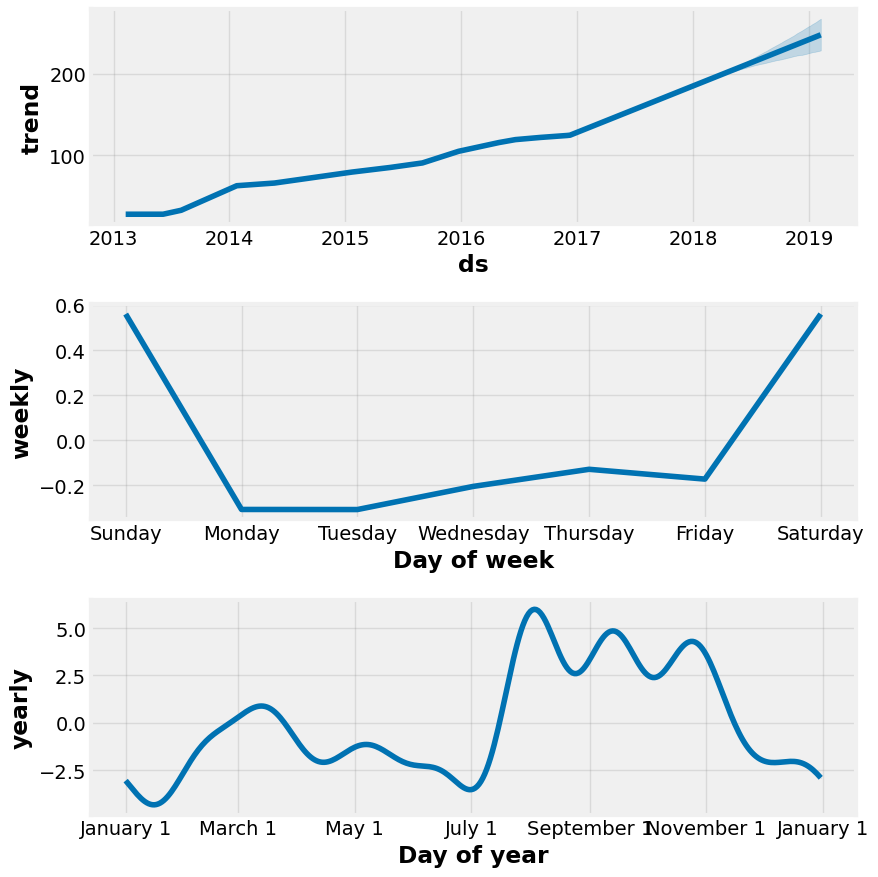

In [40]:
forecast_fb = price_forecasting(fbph_df, 365)

06:39:27 - cmdstanpy - INFO - Chain [1] start processing
06:39:28 - cmdstanpy - INFO - Chain [1] done processing


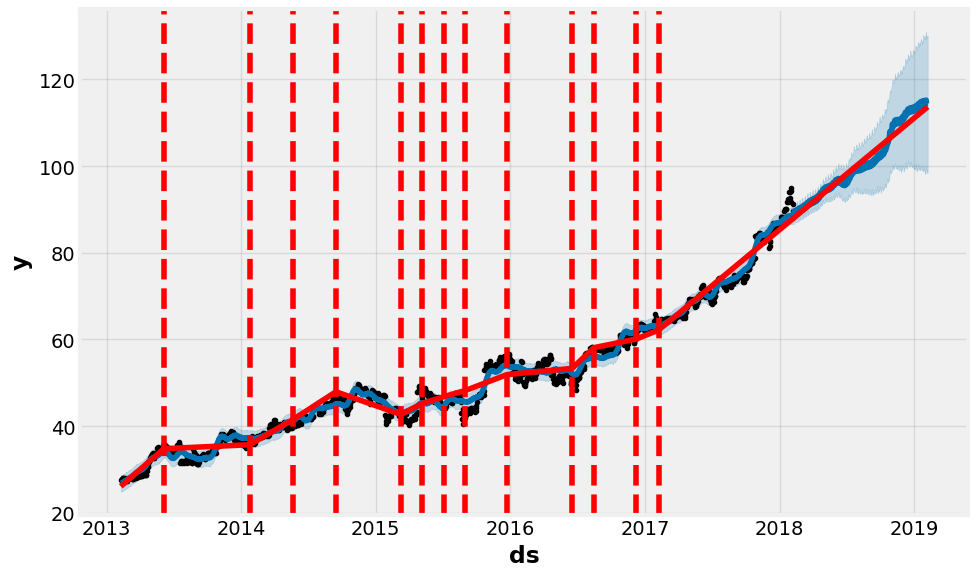

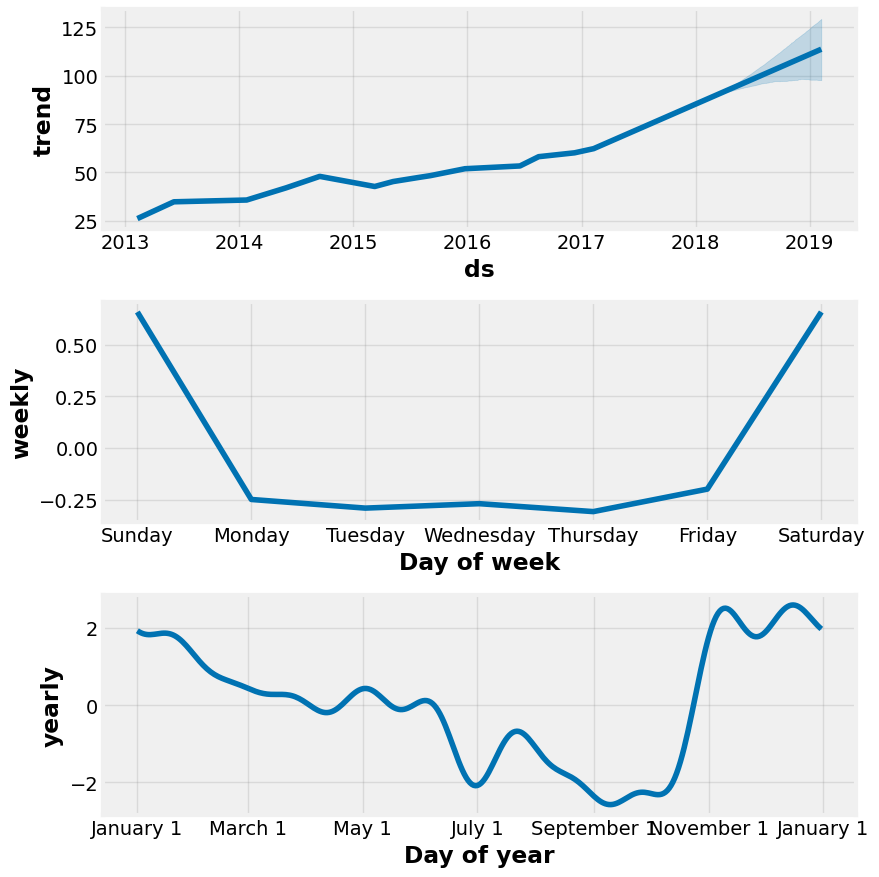

In [41]:
forecast_msft = price_forecasting(msftph_df, 365)

06:39:51 - cmdstanpy - INFO - Chain [1] start processing
06:39:51 - cmdstanpy - INFO - Chain [1] done processing


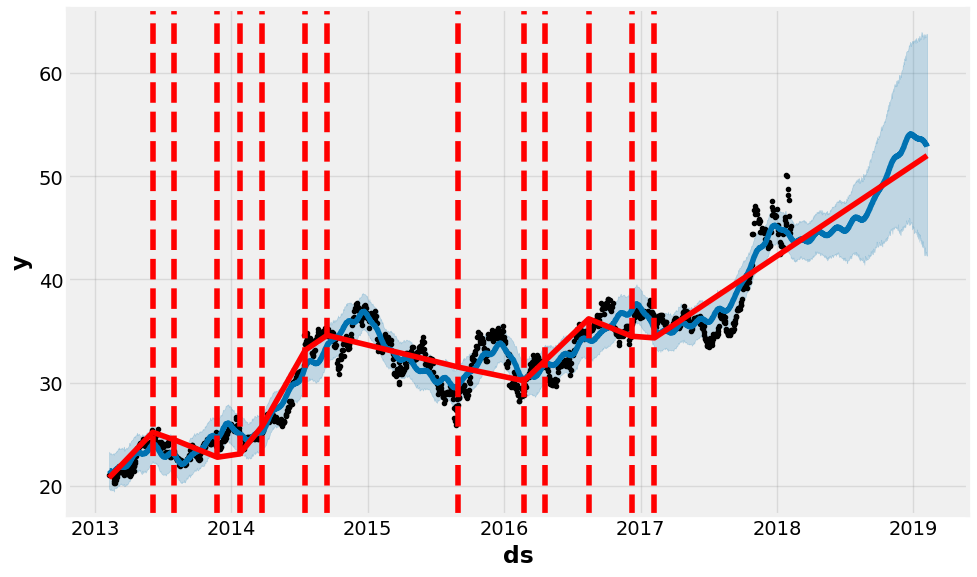

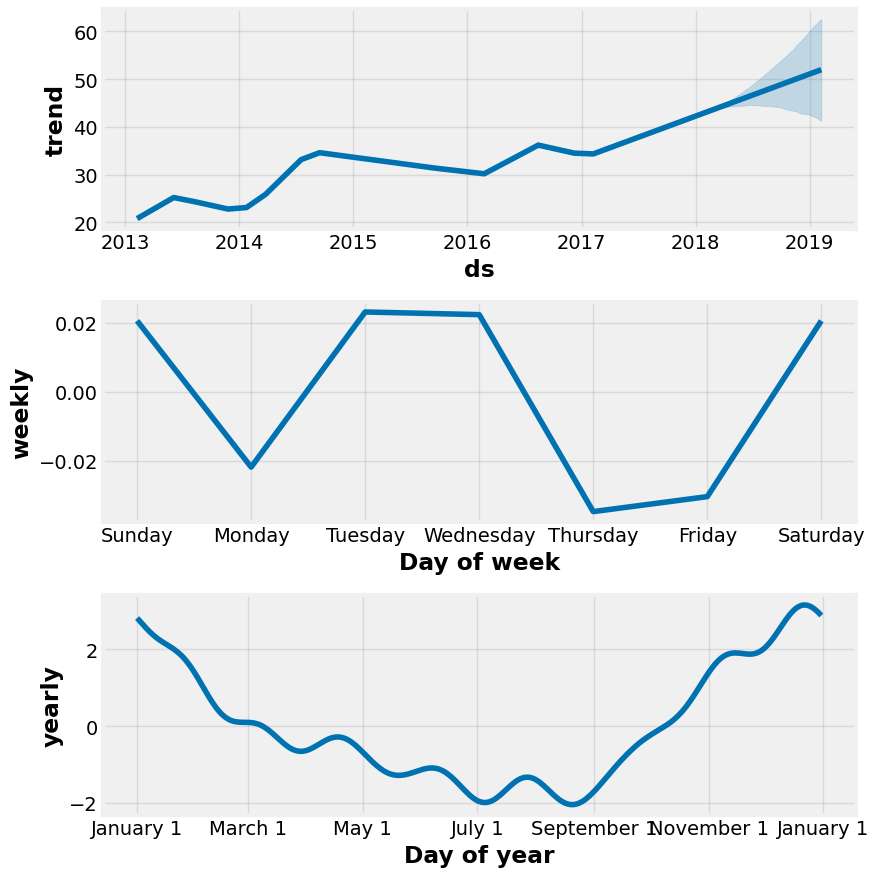

In [42]:
forecast_intc = price_forecasting(intcph_df, 365)

06:40:18 - cmdstanpy - INFO - Chain [1] start processing
06:40:19 - cmdstanpy - INFO - Chain [1] done processing


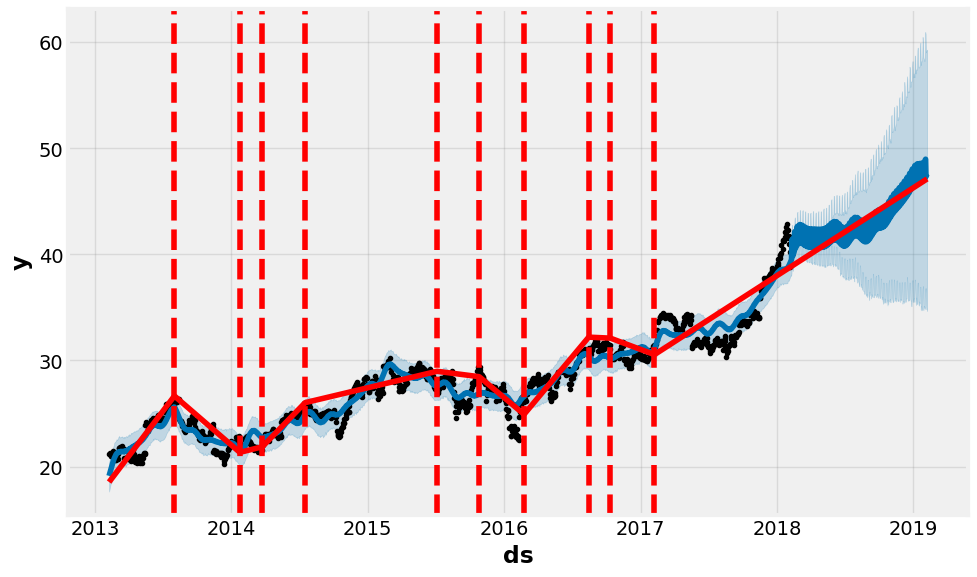

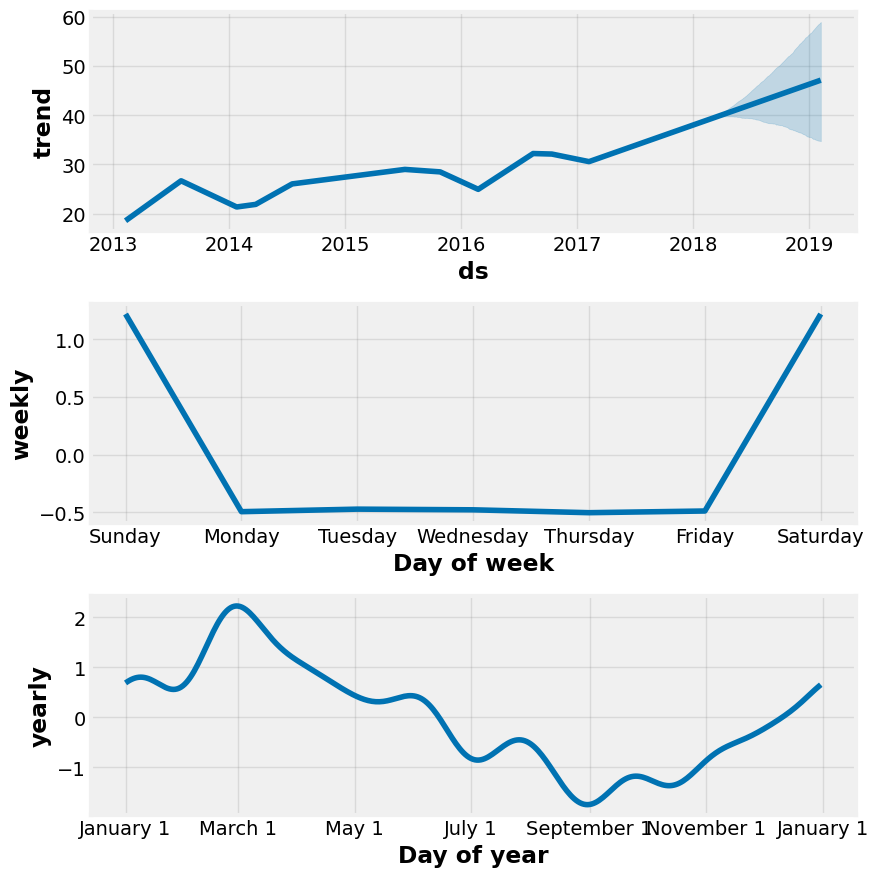

In [43]:
forecast_csco = price_forecasting(cscoph_df, 365)

06:40:34 - cmdstanpy - INFO - Chain [1] start processing
06:40:34 - cmdstanpy - INFO - Chain [1] done processing


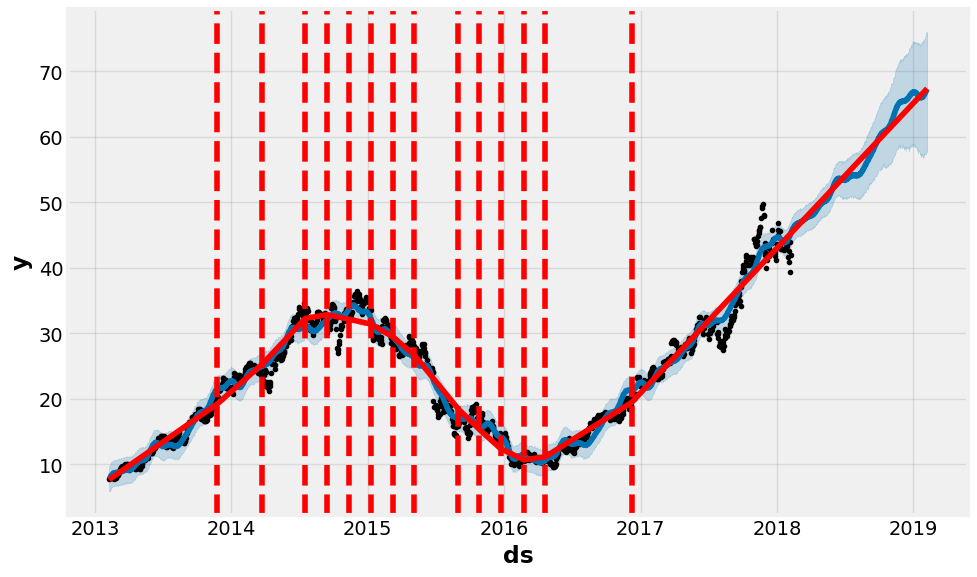

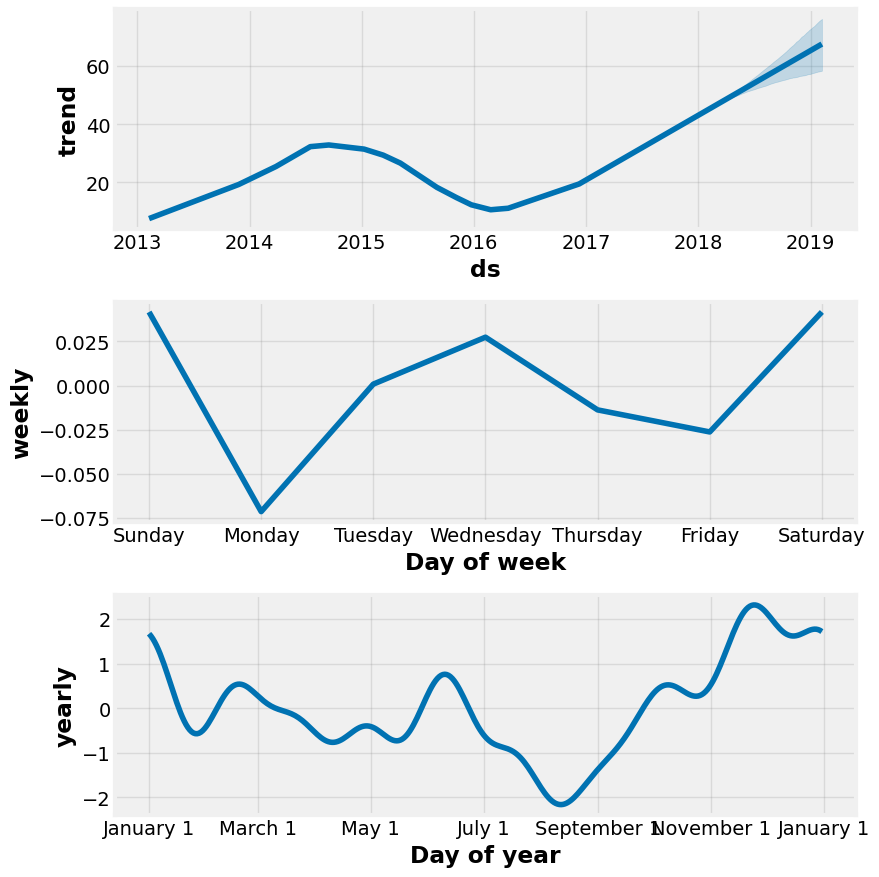

In [44]:
forecast_mu = price_forecasting(muph_df, 365)

Forecasting using Auto-ARIMA

In [28]:
# let's find seasonal decomposition of time-series models
def decomposition(df, period):
    # decompistion instance
    result_decom = seasonal_decompose(df['y'], model="additive",
                                      period=period, extrapolate_trend='freq')
    # plot the componenets
    fig = result_decom.plot()
    fig.set_size_inches((10, 6))
    # Tight layout to realign things
    fig.tight_layout()
    plt.show()

    # capture the compoenets
    trend = result_decom.trend
    season = result_decom.seasonal
    reside = result_decom.resid
    return trend, season, reside

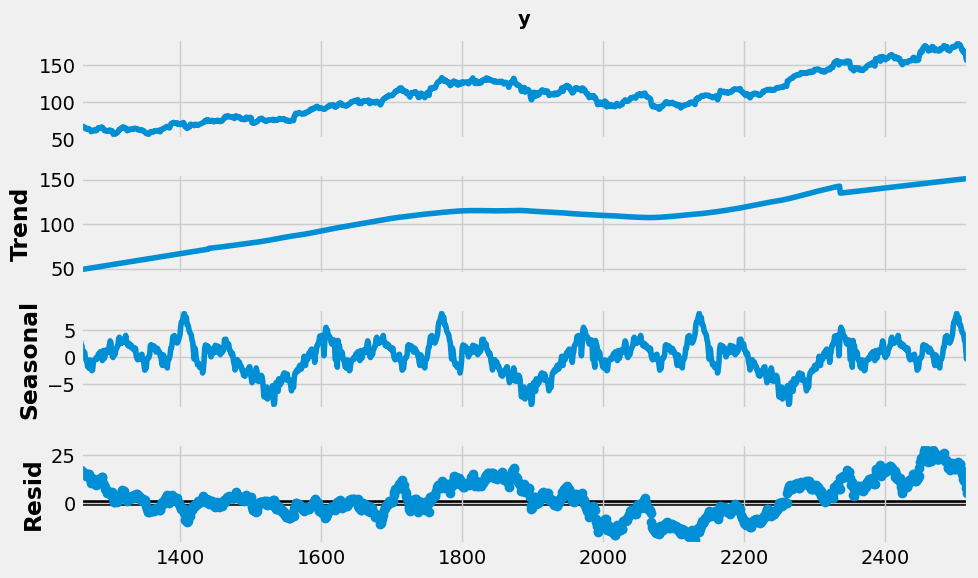

In [29]:
tr, se, re = decomposition(aaplph_df, 365)

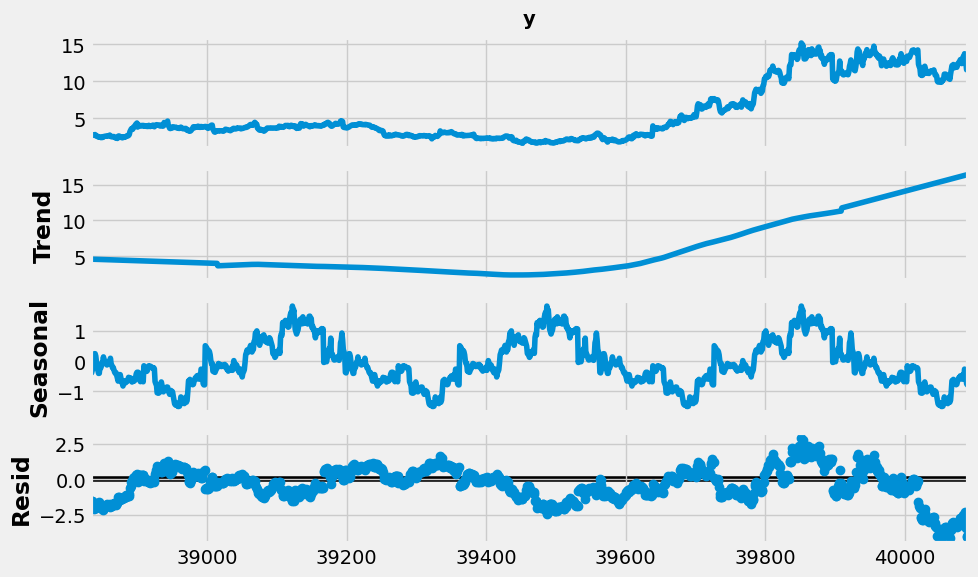

In [30]:
tr, se, re = decomposition(amdph_df, 365)

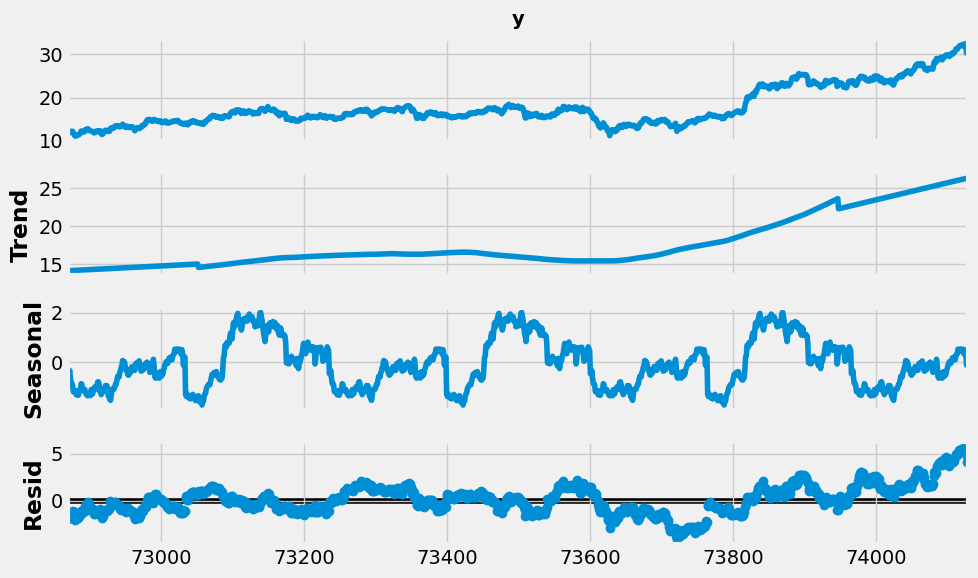

In [45]:
tr, se, re = decomposition(bacph_df, 365)

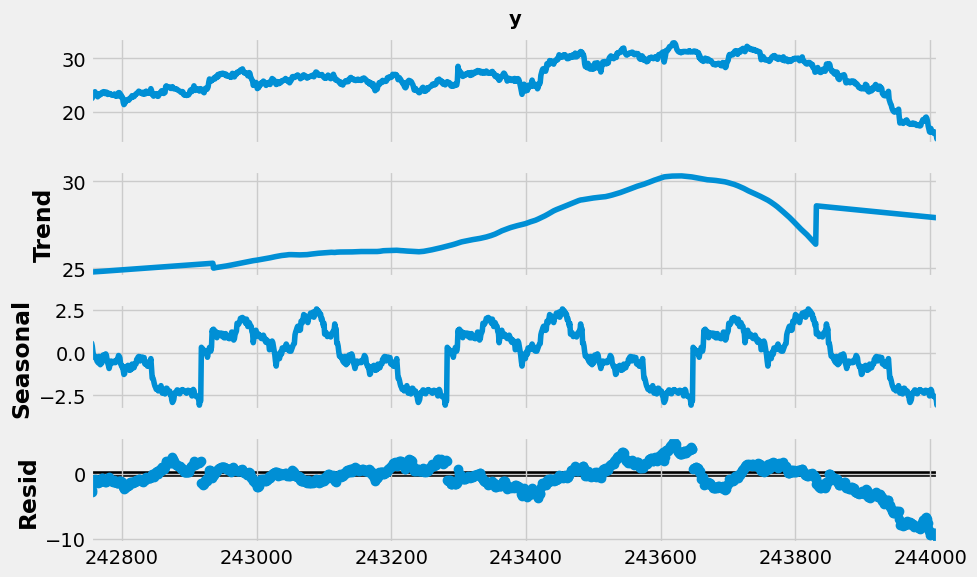

In [46]:
tr, se, re = decomposition(geph_df, 365)

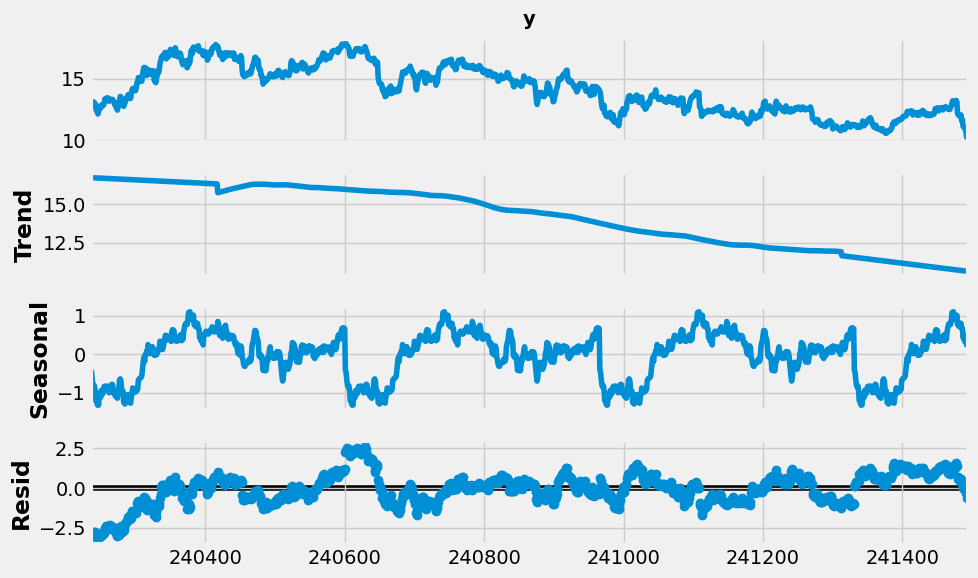

In [48]:
tr, se, re = decomposition(fph_df, 365)

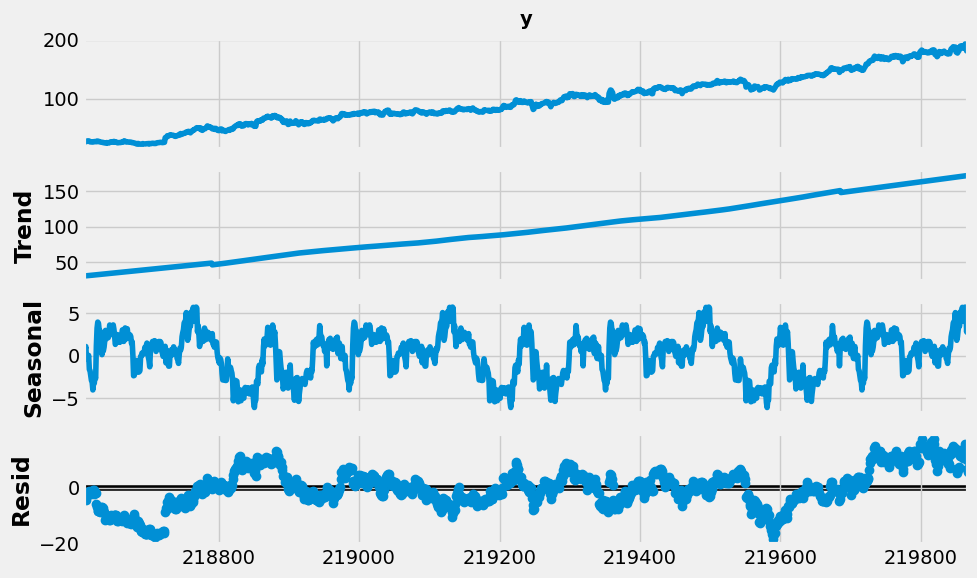

In [49]:
tr, se, re = decomposition(fbph_df, 365)

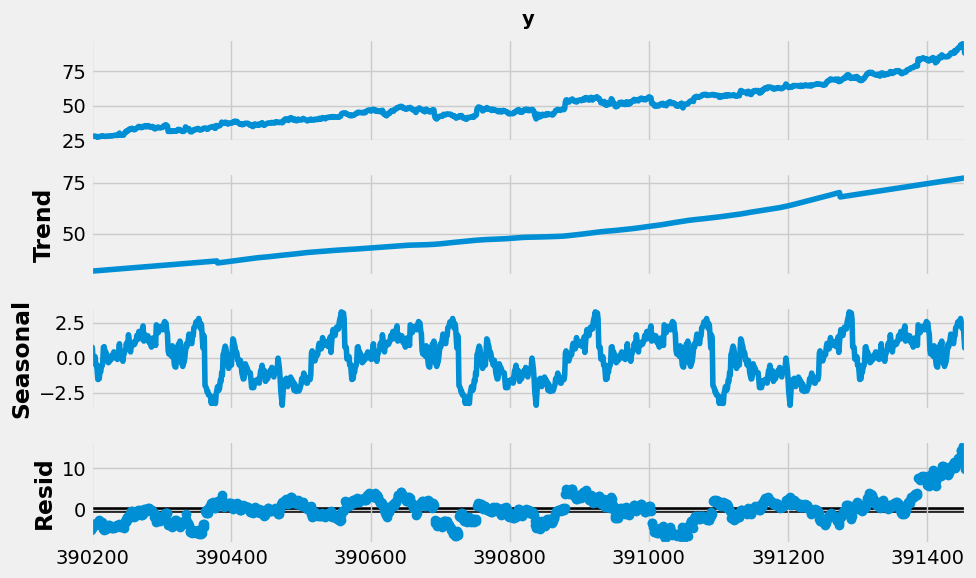

In [50]:
tr, se, re = decomposition(msftph_df, 365)

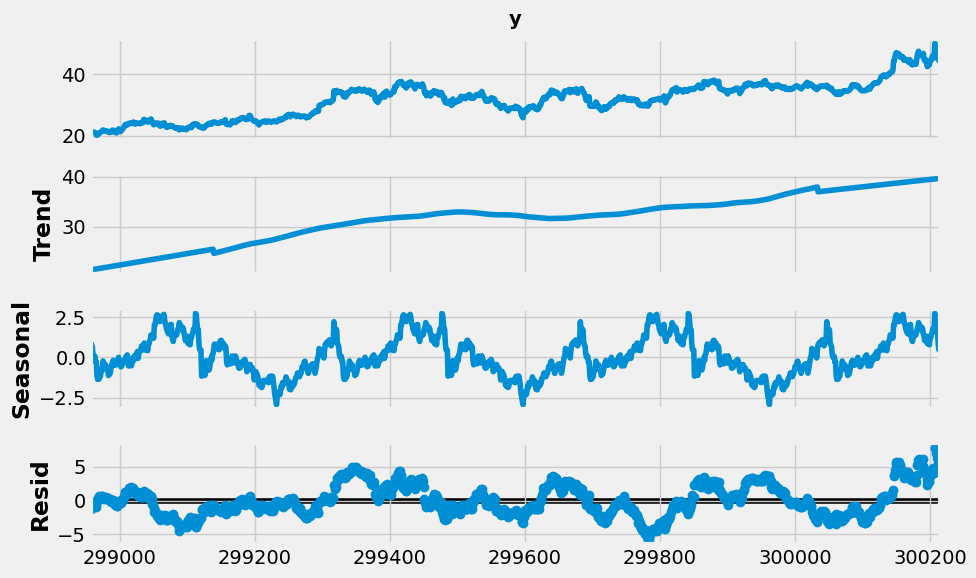

In [51]:
tr, se, re = decomposition(intcph_df, 365)

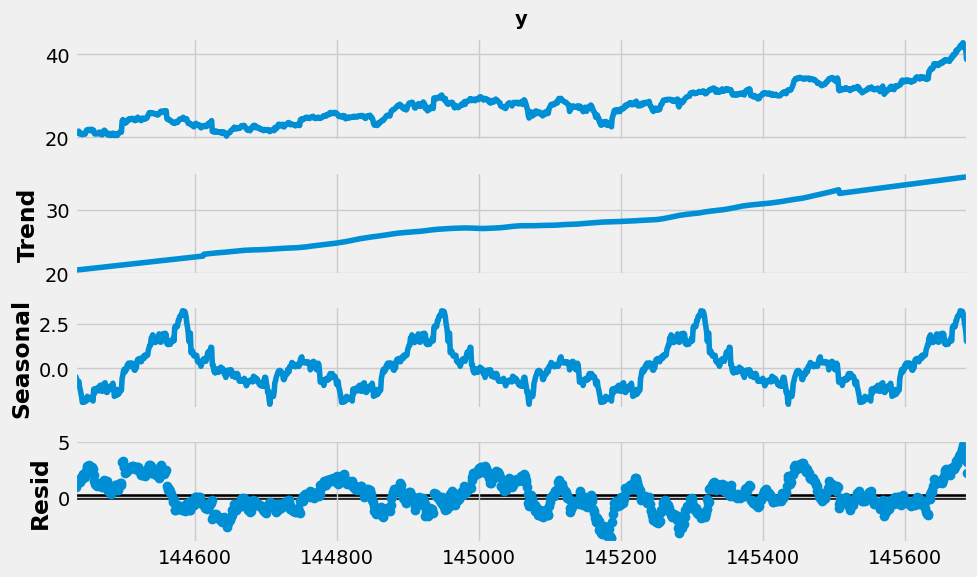

In [52]:
tr, se, re = decomposition(cscoph_df, 365)

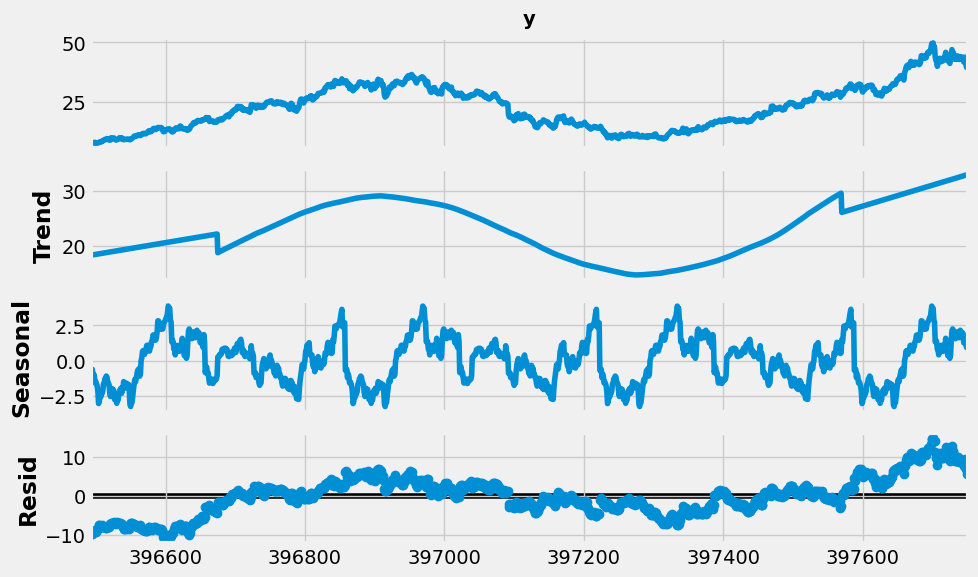

In [53]:
tr, se, re = decomposition(muph_df, 365)

In [31]:
def acf_pacf(df, lags):
    var = df['y']
    # plot the acf plot
    fig = plot_acf(var, lags=lags)
    fig.set_size_inches((9, 5))
    fig.tight_layout()
    plt.show()

    # plot the pacf plots
    fig = plot_pacf(var, lags=lags)
    fig.set_size_inches((9,5))
    fig.tight_layout()
    plt.show()

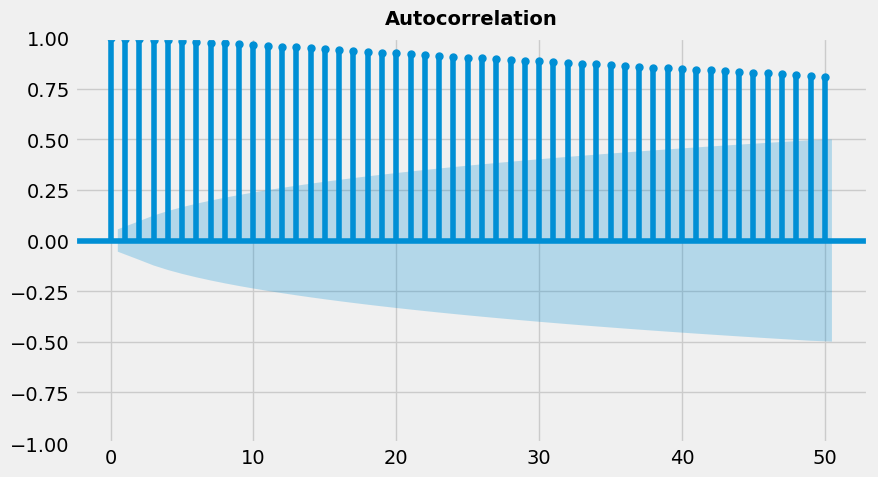

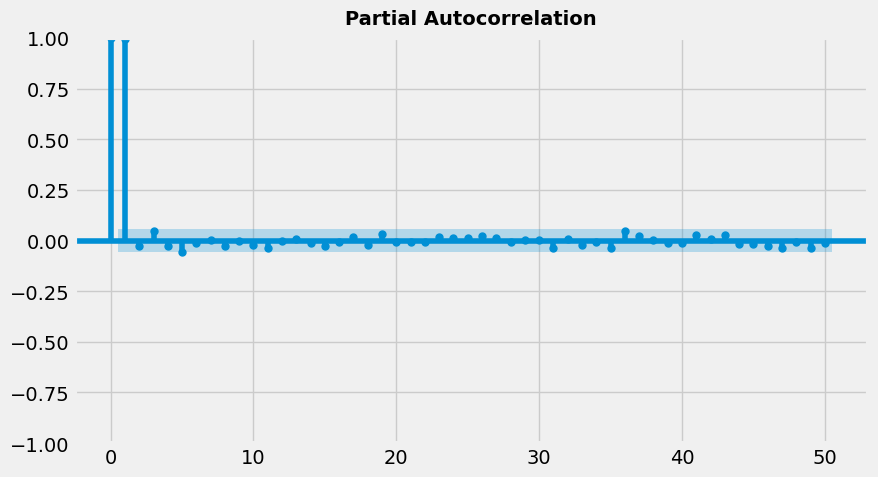

In [32]:
acf_pacf(aaplph_df, 50)

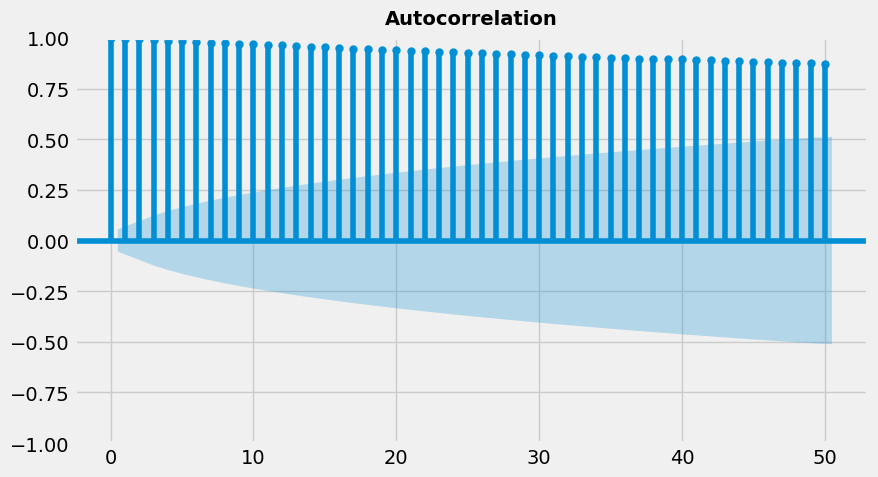

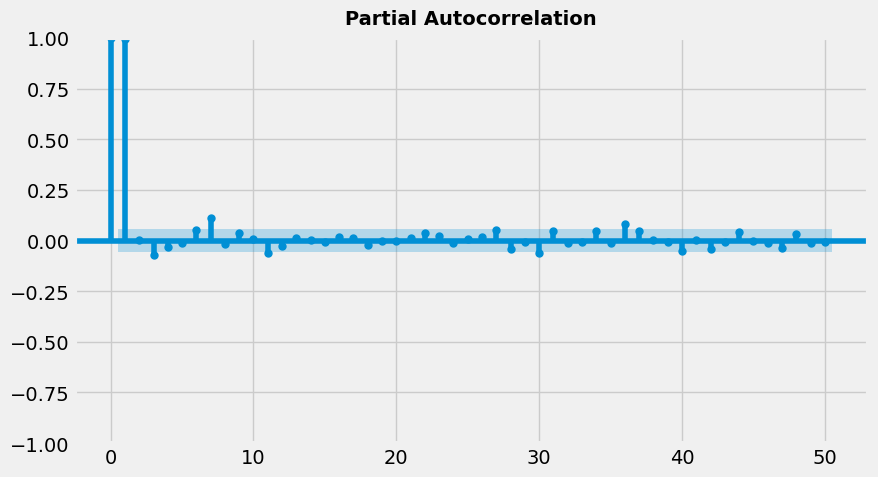

In [33]:
acf_pacf(amdph_df, 50)

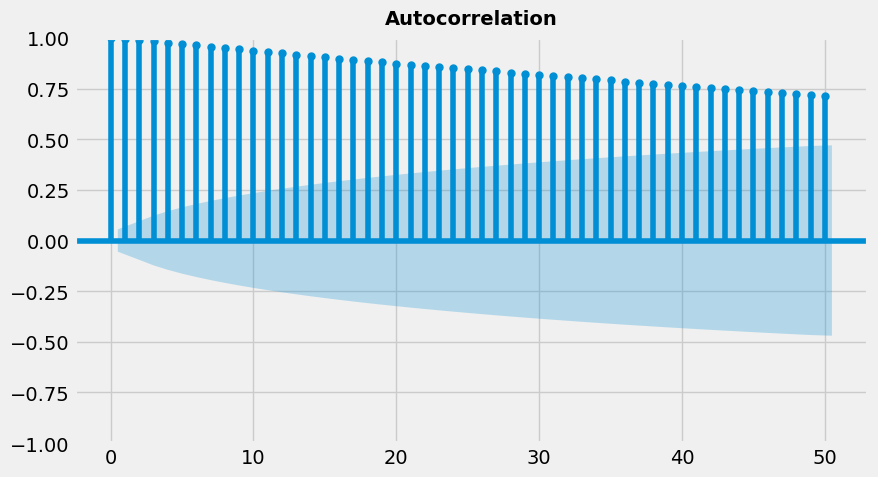

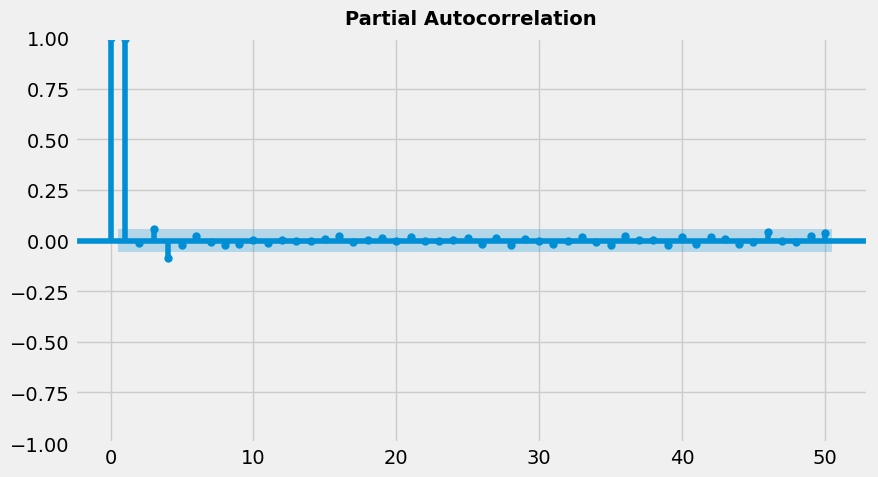

In [54]:
acf_pacf(bacph_df, 50)

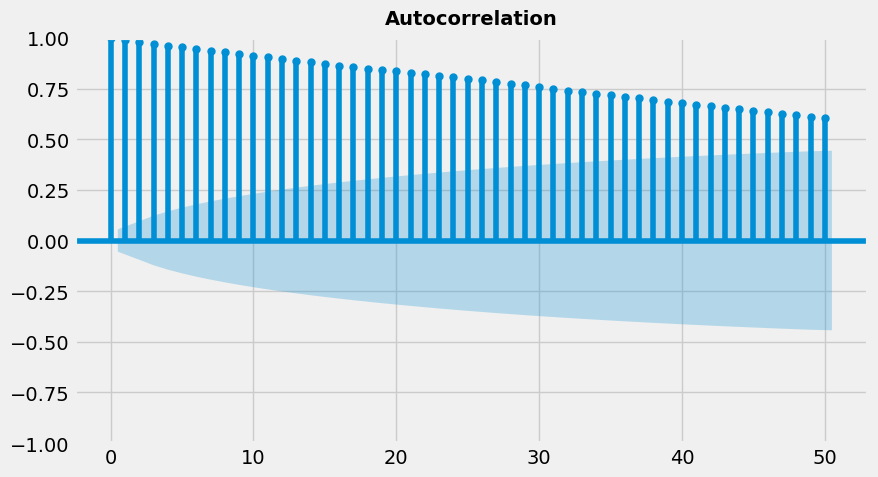

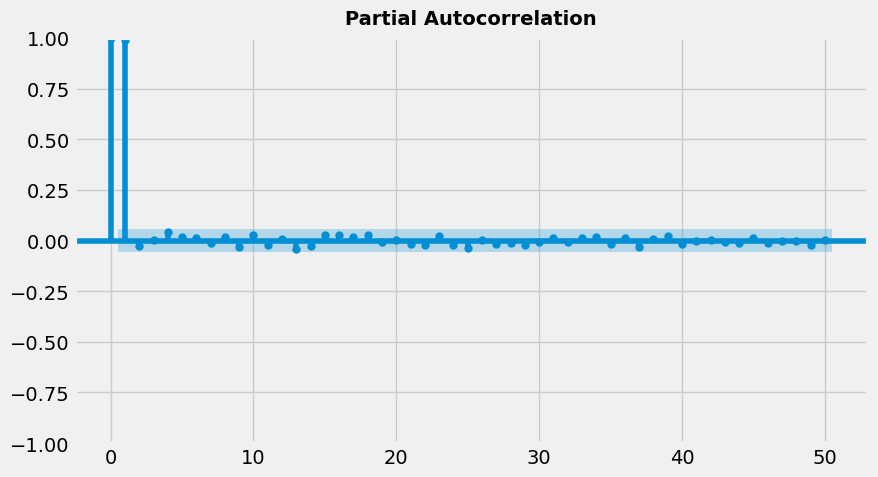

In [55]:
acf_pacf(geph_df, 50)

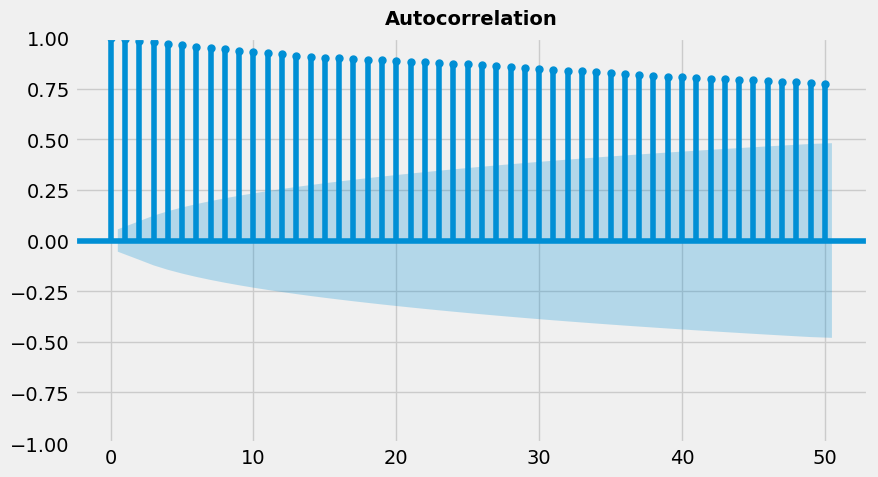

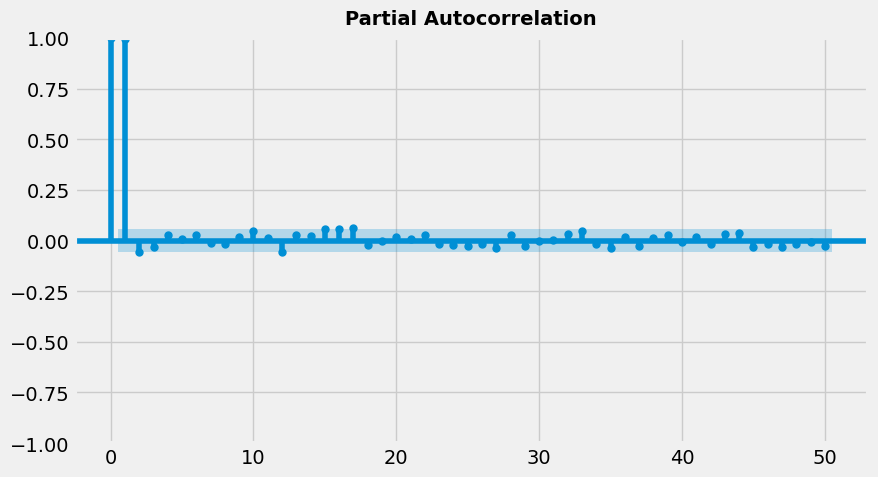

In [56]:
acf_pacf(fph_df, 50)

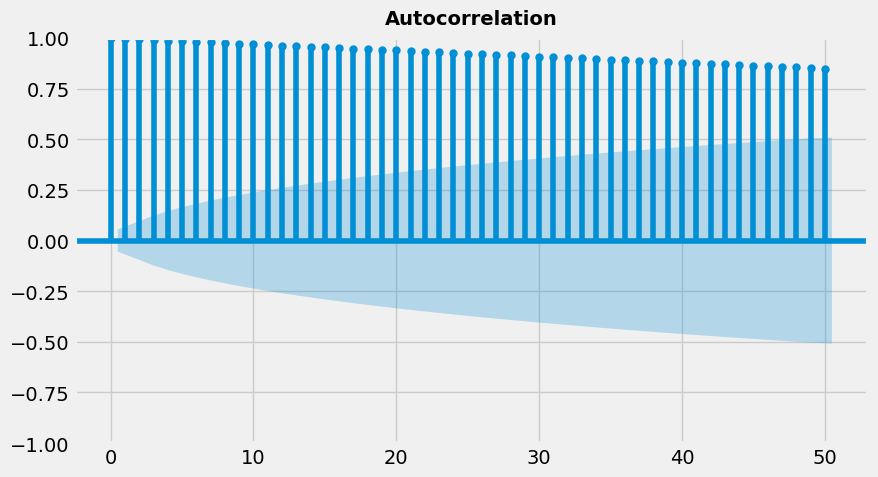

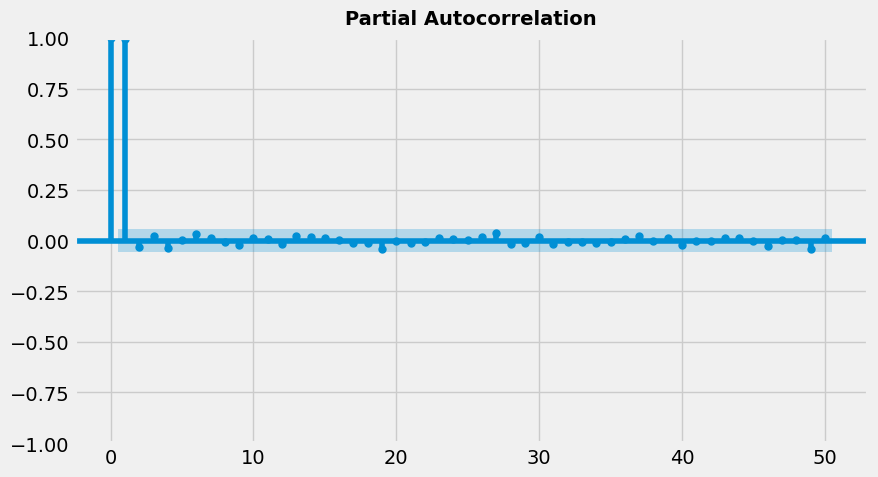

In [57]:
acf_pacf(fbph_df, 50)

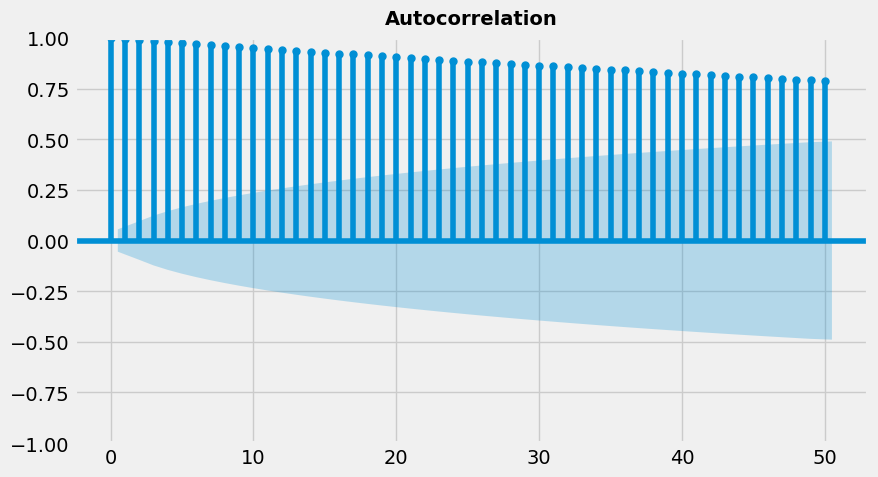

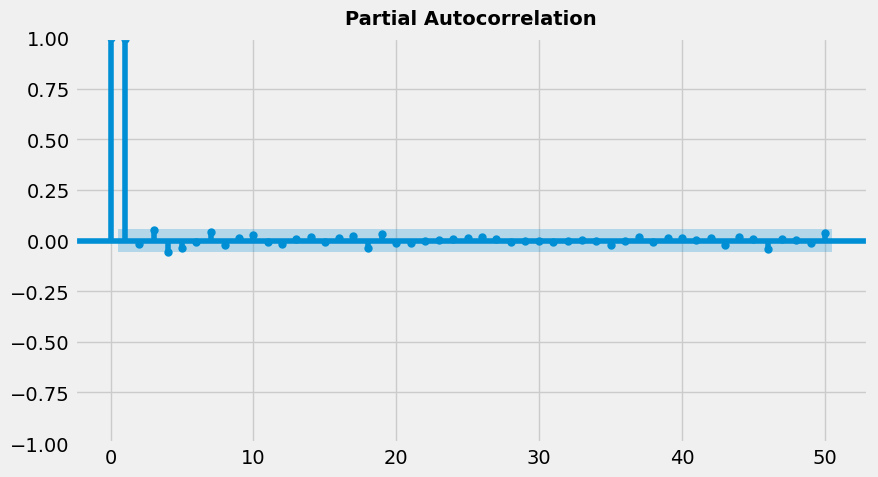

In [58]:
acf_pacf(msftph_df, 50)

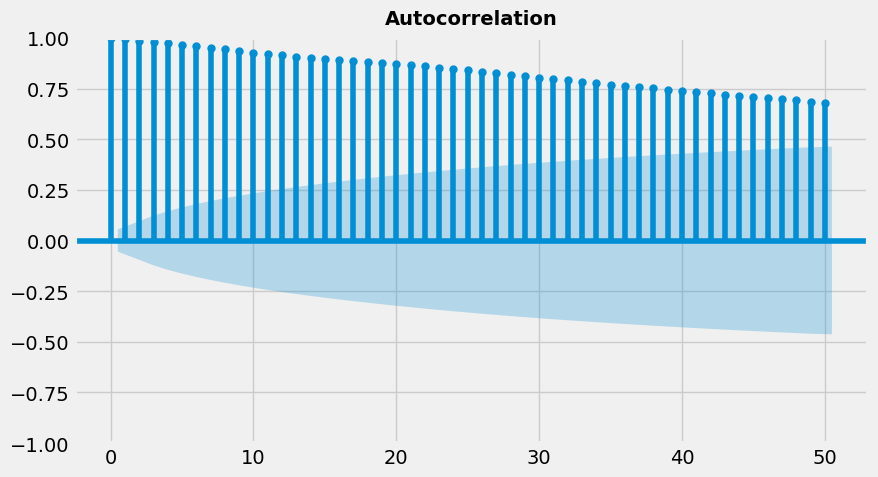

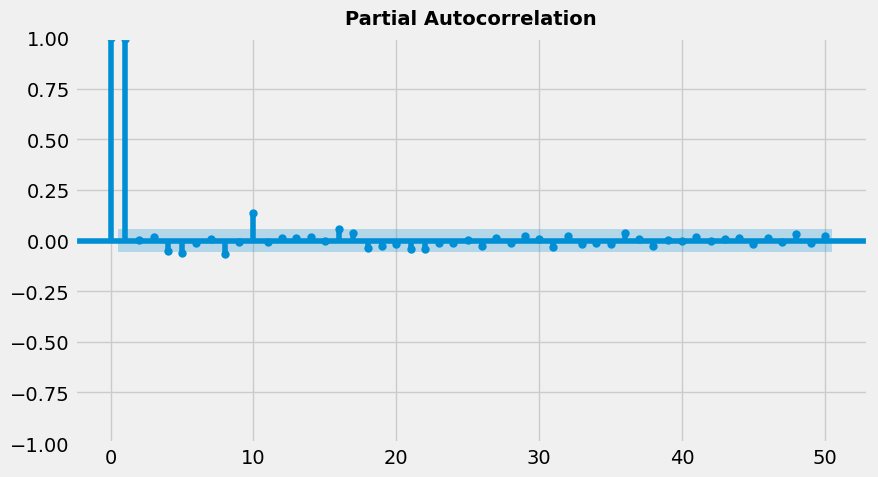

In [59]:
acf_pacf(intcph_df, 50)

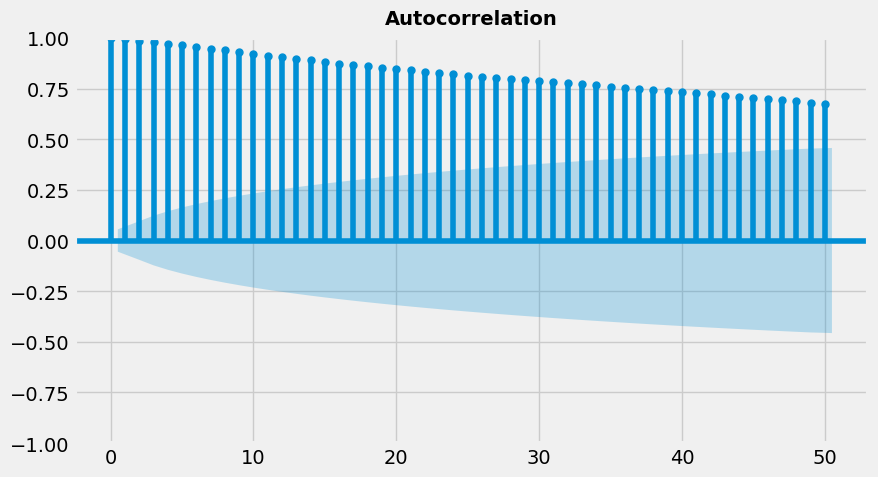

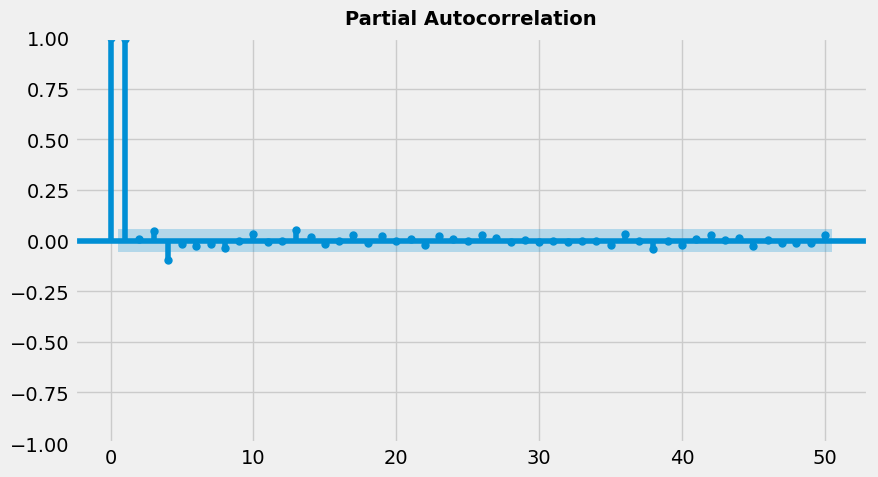

In [60]:
acf_pacf(cscoph_df, 50)

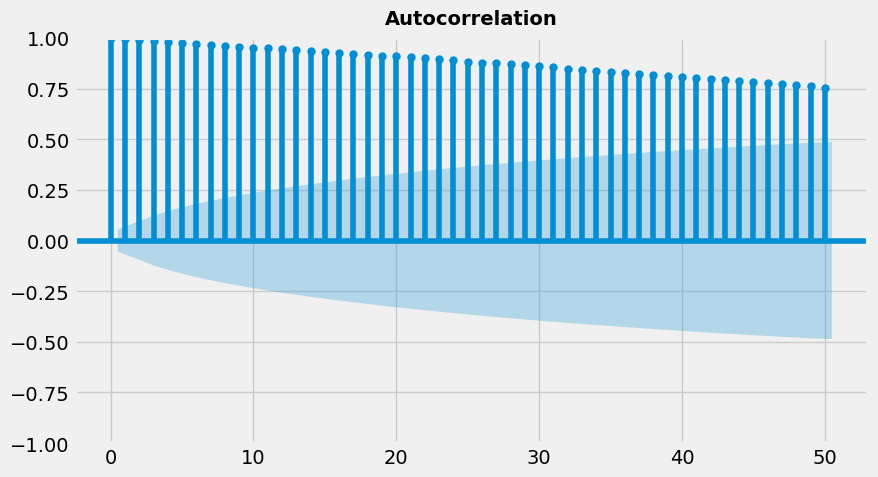

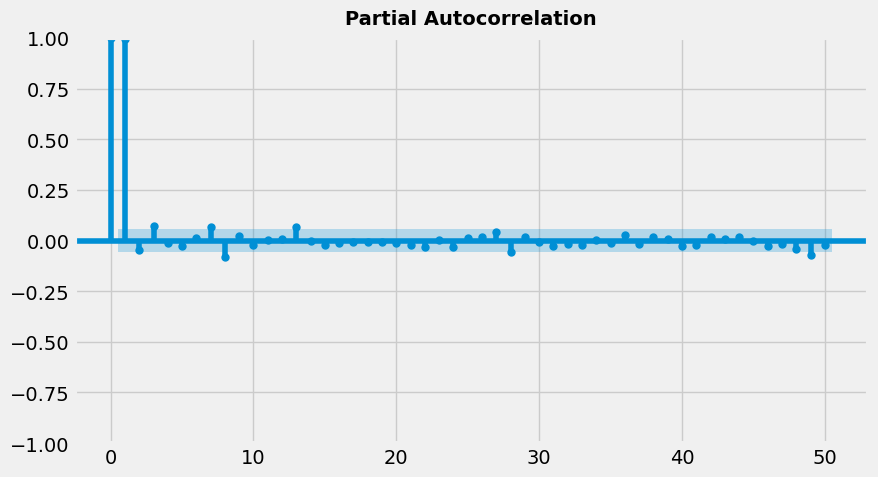

In [61]:
acf_pacf(muph_df, 50)

Fuller hypothesis

H0 = 1
H1 < 1

In [34]:
#adfuller test
def adfuller_test(df):
    adfuller_result = adfuller(df['y'], autolag = 'AIC')
    adfuller_output = pd.Series(adfuller_result[:4], index = ['test statistic', 'p-value', 'Lags Used', 'Number of Observations Used'])

    print(adfuller_output)

In [63]:
print("adfuller test results")
adfuller_test(aaplph_df)
print("----"*10)
print("adfuller test results")
adfuller_test(amdph_df)
print("----"*10)
print("adfuller test results")
adfuller_test(bacph_df)
print("----"*10)
print("adfuller test results")
adfuller_test(geph_df)
print("----"*10)
print("adfuller test results")
adfuller_test(fph_df)
print("----"*10)
print("adfuller test results")
adfuller_test(fbph_df)
print("----"*10)
print("adfuller test results")
adfuller_test(msftph_df)
print("----"*10)
print("adfuller test results")
adfuller_test(intcph_df)
print("----"*10)
print("adfuller test results")
adfuller_test(cscoph_df)
print("----"*10)
print("adfuller test results")
adfuller_test(muph_df)

adfuller test results
test statistic                   -0.665091
p-value                           0.855586
Lags Used                         0.000000
Number of Observations Used    1258.000000
dtype: float64
----------------------------------------
adfuller test results
test statistic                   -0.380239
p-value                           0.913346
Lags Used                         6.000000
Number of Observations Used    1252.000000
dtype: float64
----------------------------------------
adfuller test results
test statistic                    0.671680
p-value                           0.989255
Lags Used                         2.000000
Number of Observations Used    1256.000000
dtype: float64
----------------------------------------
adfuller test results
test statistic                   -0.087875
p-value                           0.950633
Lags Used                         2.000000
Number of Observations Used    1256.000000
dtype: float64
----------------------------------------


Train test split

In [65]:
def arima_split(df, co_name):
  size = int(len(df)*0.95)
  train_df = (df['y'])[:size]
  test_df = (df['y'])[size:]

  print(f"data splits of company {co_name}")
  print(f"Train size: {len(train_df)}, Test size: {len(test_df)}")
  return train_df, test_df

aapl_train, aapl_test = arima_split(aaplph_df, 'AAPL')
amd_train, amd_test = arima_split(amdph_df, 'AMD')
bac_train, bac_test = arima_split(bacph_df, 'BAC')
ge_train, ge_test = arima_split(geph_df, 'GE')
f_train, f_test = arima_split(fph_df, 'F')
fb_train, fb_test = arima_split(fbph_df, 'FB')
msft_train, msft_test = arima_split(msftph_df, 'MSFT')
intc_train, intc_test = arima_split(intcph_df, 'INTC')
csco_train, csco_test = arima_split(cscoph_df, 'CSCO')
mu_train, mu_test = arima_split(muph_df, 'MU')

data splits of company AAPL
Train size: 1196, Test size: 63
data splits of company AMD
Train size: 1196, Test size: 63
data splits of company BAC
Train size: 1196, Test size: 63
data splits of company GE
Train size: 1196, Test size: 63
data splits of company F
Train size: 1196, Test size: 63
data splits of company FB
Train size: 1196, Test size: 63
data splits of company MSFT
Train size: 1196, Test size: 63
data splits of company INTC
Train size: 1196, Test size: 63
data splits of company CSCO
Train size: 1196, Test size: 63
data splits of company MU
Train size: 1196, Test size: 63


In [67]:
def find_best_fit_arima(df, co_name):
    print(f"Arima model for {co_name}")

    model = pm.auto_arima(df, test = 'adf',
                          start_p = 1, start_q = 1,
                          max_p = 3, max_q = 3,
                          d = None, seasonal = True,
                          start_P = 0, m = 3,
                          trace = True, error_action = 'ignore',
                          suppress_warnings = True, stepwise = True,
                          D = 1, information_criterion = 'aic')

    print(model.summary())
    print('\n')

    return model

model_aapl = find_best_fit_arima(aapl_train, 'AAPL')
model_amd = find_best_fit_arima(amd_train, 'AMD')
model_bac = find_best_fit_arima(bac_train, 'BAC')
model_ge = find_best_fit_arima(ge_train, 'GE')
model_f = find_best_fit_arima(f_train, 'F')
model_fb = find_best_fit_arima(fb_train, 'FB')
model_msft = find_best_fit_arima(msft_train, 'MSFT')
model_intc = find_best_fit_arima(intc_train, 'INTC')
model_csco = find_best_fit_arima(csco_train, 'CSCO')
model_mu = find_best_fit_arima(mu_train, 'MU')

Arima model for AAPL
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[3] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(0,0,0)(0,1,0)[3] intercept   : AIC=5737.373, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[3] intercept   : AIC=4795.557, Time=0.10 sec
 ARIMA(0,0,1)(0,1,1)[3] intercept   : AIC=5191.240, Time=0.10 sec
 ARIMA(0,0,0)(0,1,0)[3]             : AIC=5746.692, Time=0.01 sec
 ARIMA(1,0,0)(0,1,0)[3] intercept   : AIC=5067.196, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[3] intercept   : AIC=4657.095, Time=0.18 sec
 ARIMA(1,0,0)(2,1,1)[3] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(1,0,0)(1,1,1)[3] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,0)(2,1,0)[3] intercept   : AIC=5740.397, Time=0.10 sec
 ARIMA(2,0,0)(2,1,0)[3] intercept   : AIC=4647.664, Time=0.22 sec
 ARIMA(2,0,0)(1,1,0)[3] intercept   : AIC=4777.434, Time=0.10 sec
 ARIMA(2,0,0)(2,1,1)[3] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(2,0,0)(1,1,1)[3] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,1)(2,1,0)[3] intercept   :

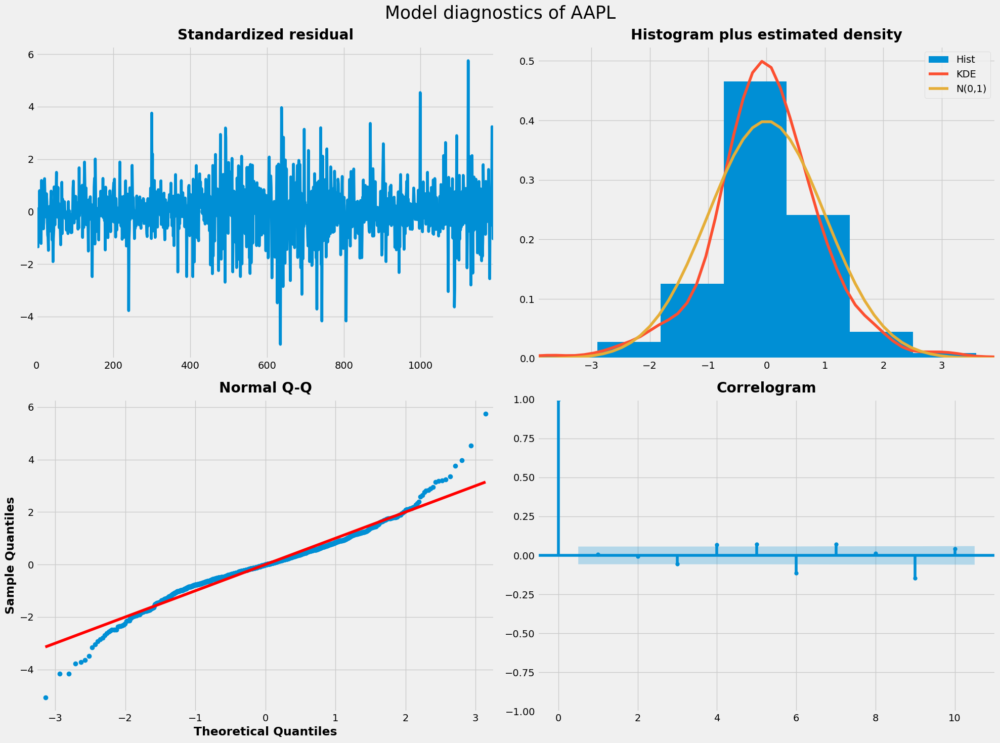

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


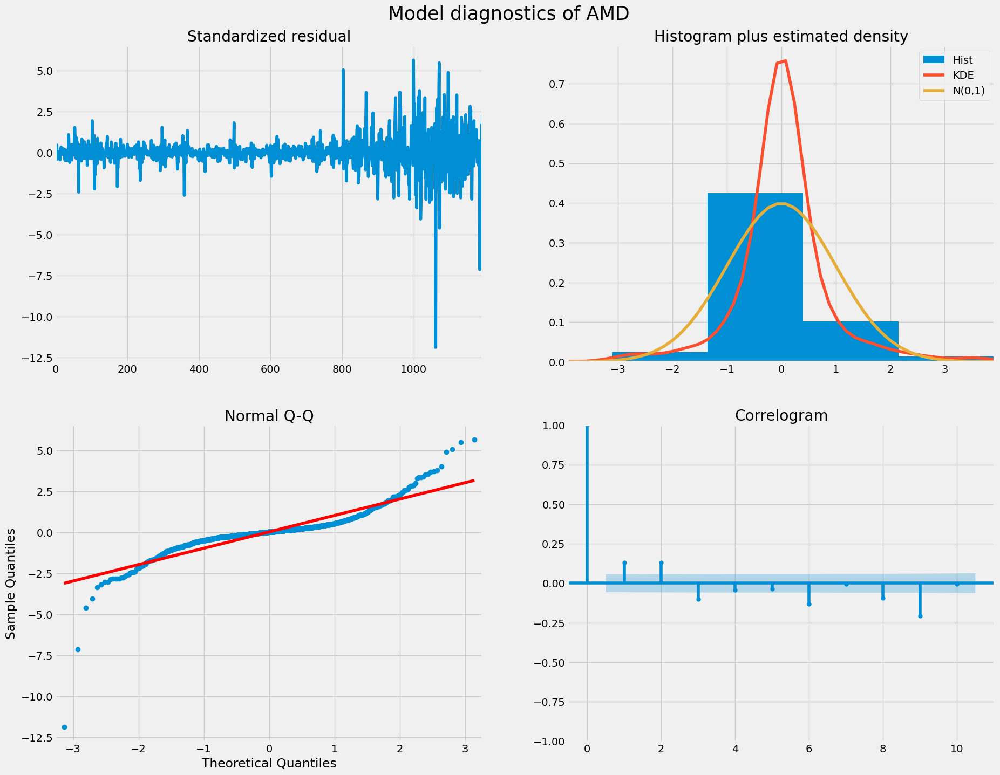

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


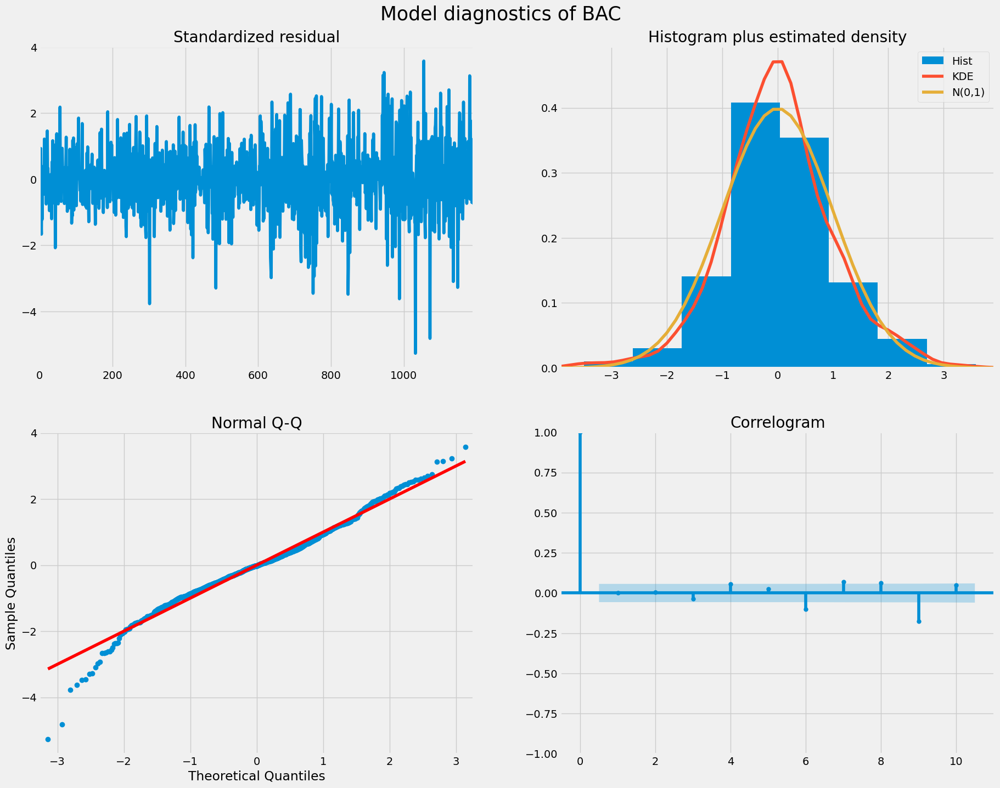

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


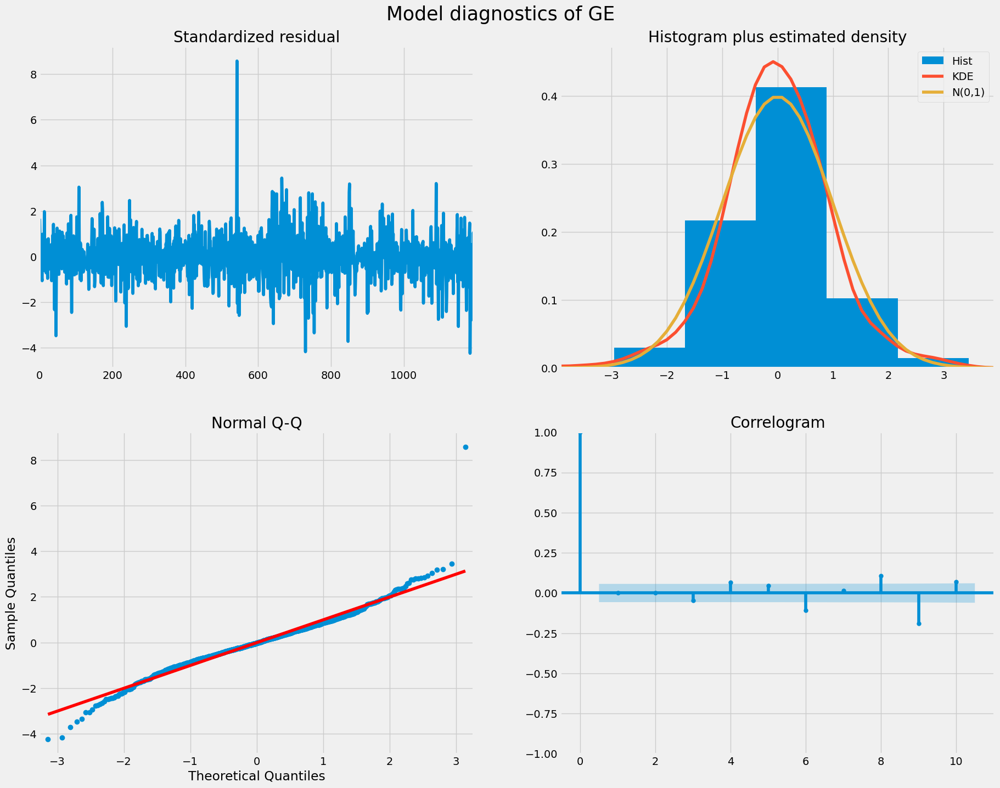

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


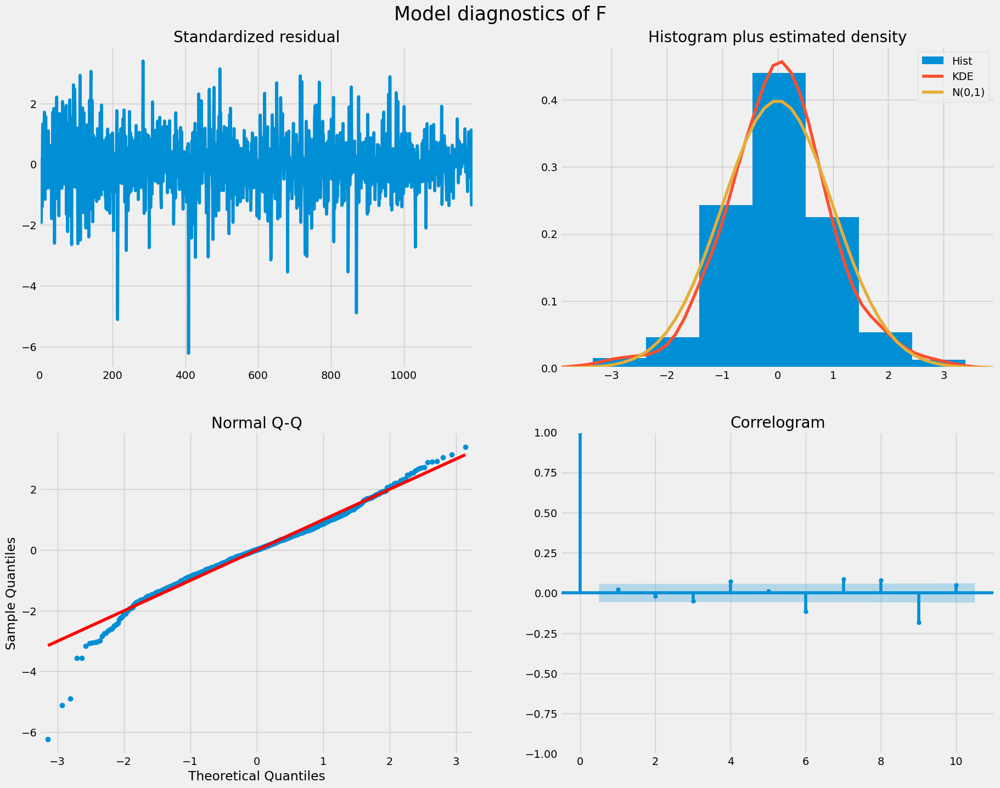

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


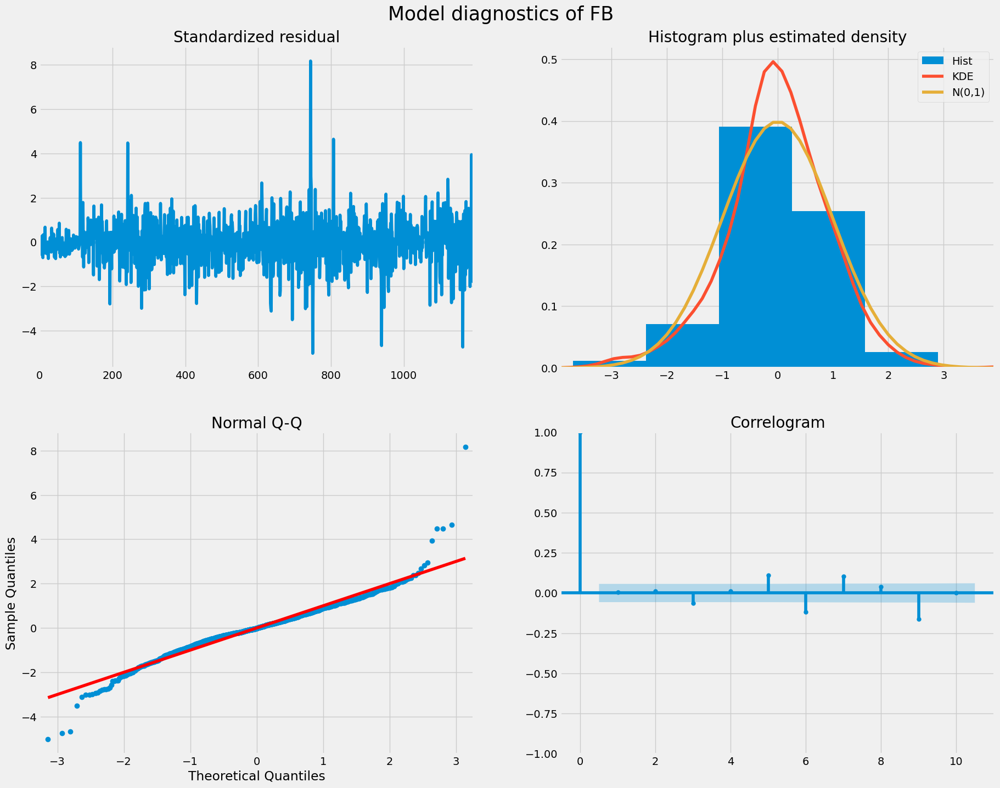

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


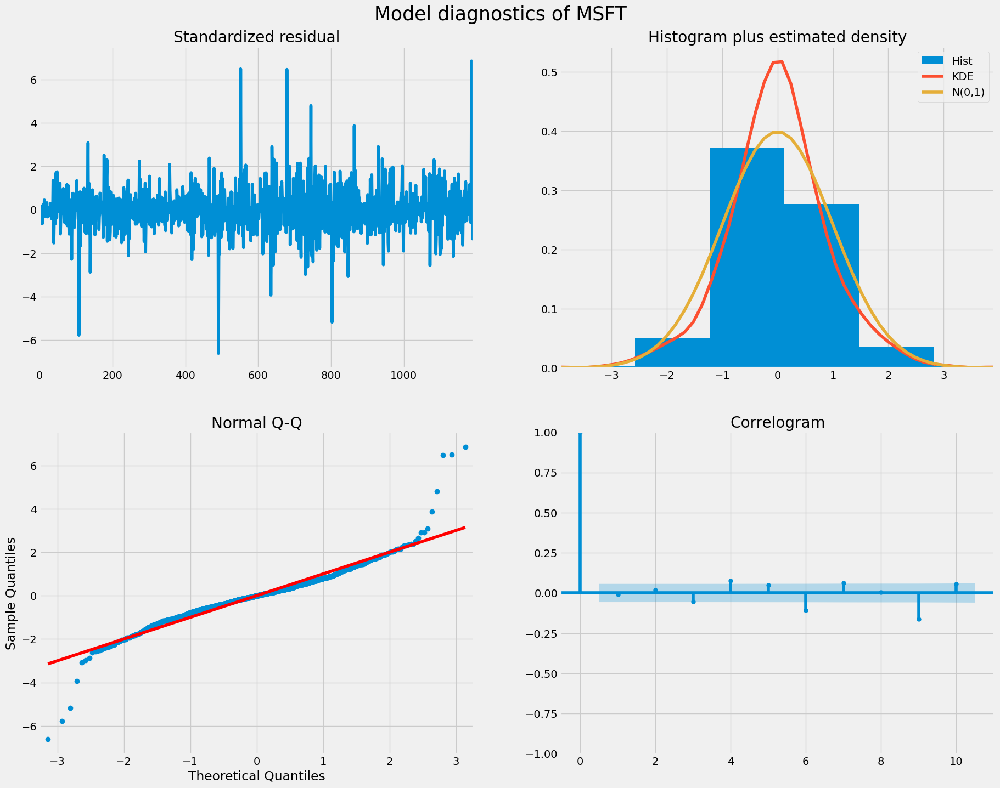

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


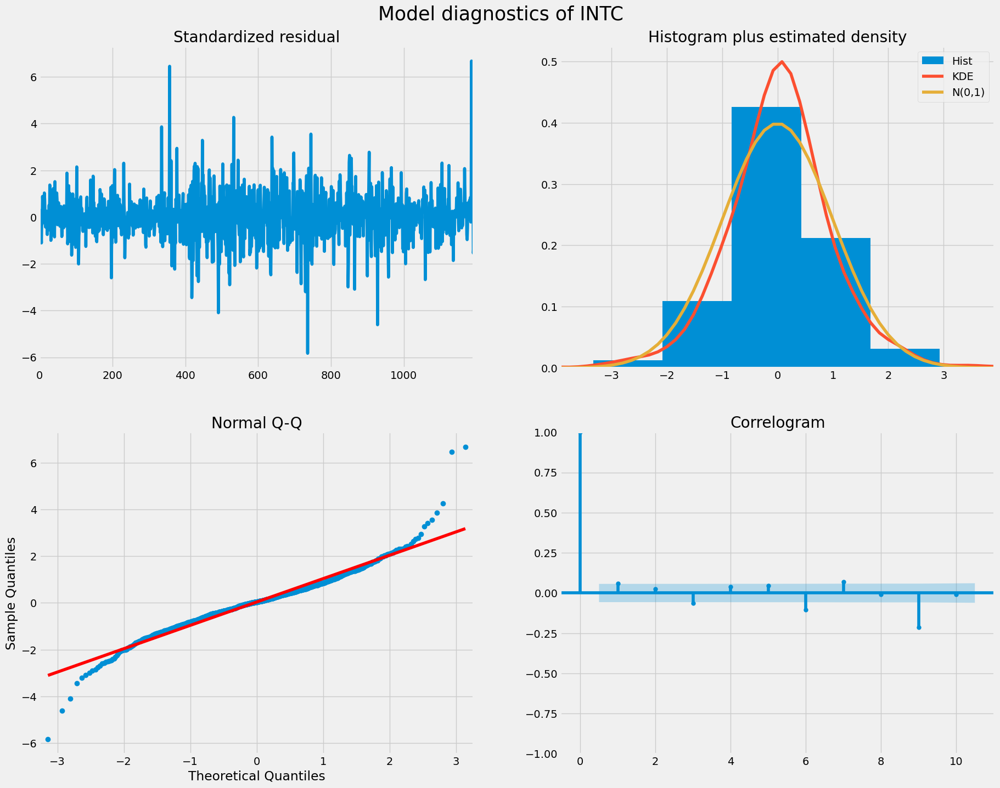

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


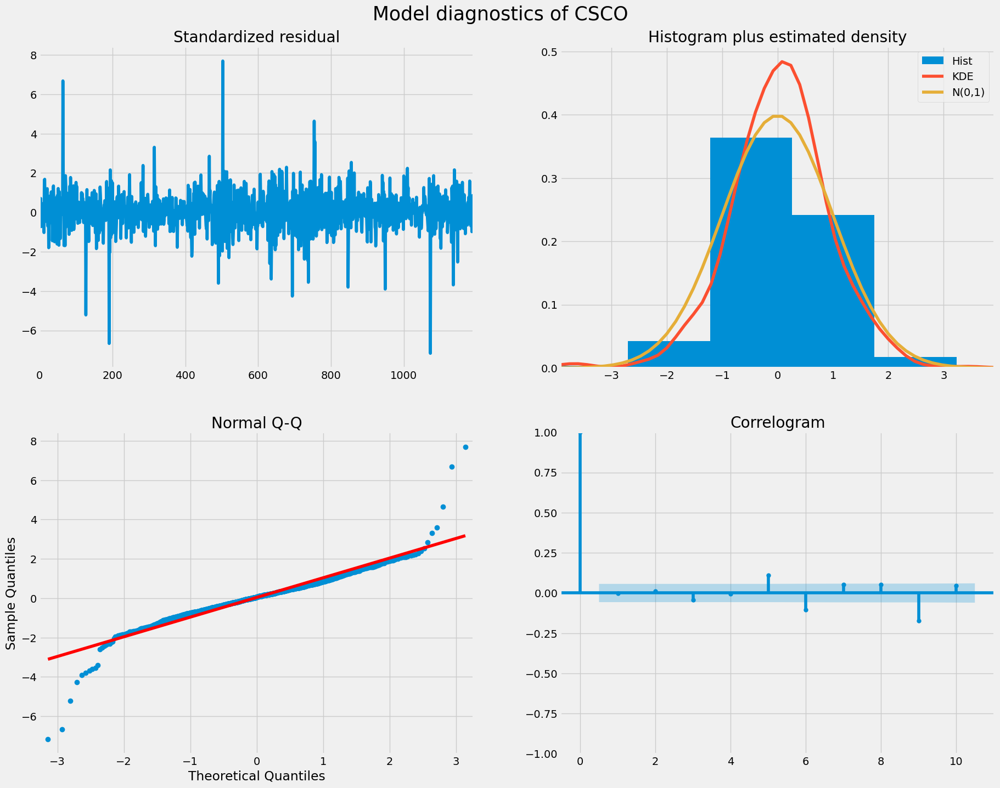

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


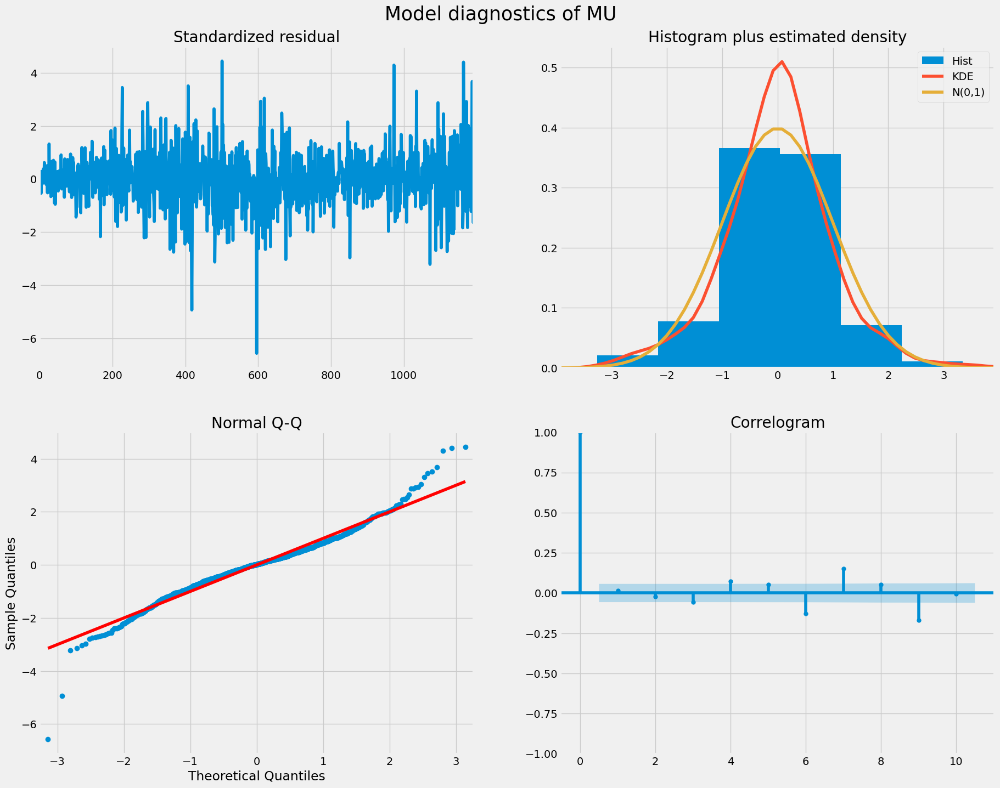

In [68]:
# Forcasting plot
def display_model_plots(model, co_name):
    plt.style.use('fivethirtyeight')
    model.plot_diagnostics(figsize = (20, 15));
    plt.suptitle(f'Model diagnostics of {co_name}', fontsize = 25)
    plt.subplots_adjust(top = 0.93)
    plt.show()
    plt.style.use('default')

display_model_plots(model_aapl, 'AAPL')
print("-------"*30)
display_model_plots(model_amd, 'AMD')
print("-------"*30)
display_model_plots(model_bac, 'BAC')
print("-------"*30)
display_model_plots(model_ge, 'GE')
print("-------"*30)
display_model_plots(model_f, 'F')
print("-------"*30)
display_model_plots(model_fb, 'FB')
print("-------"*30)
display_model_plots(model_msft, 'MSFT')
print("-------"*30)
display_model_plots(model_intc, 'INTC')
print("-------"*30)
display_model_plots(model_csco, 'CSCO')
print("-------"*30)
display_model_plots(model_mu, 'MU')

In [ ]:
#Calculating RMSE
def make_predictions_and_print_rmse(model, test_df, co_name):
    print(f"forecasting and RMSE")

    forecast, confidence_interval = model.predict(X=test_df, n_periods = len(test_df), return_conf_int = True)
    forecasts = pd.Series(forecast, index = test_df[:len(test_df)].index)
    lower = pd.Series(confidence_interval[:, 0], index = test_df[:len(test_df)].index)
    upper = pd.Series(confidence_interval[:, 1], index = test_df[:len(test_df)].index)

    rmse = np.sqrt(np.mean((forecast.values - test_df.values) ** 2))

    print("RMSE is: ", rmse)

    return forecasts, lower, upper

forecast, lower, upper = make_predictions_and_print_rmse(model_aapl, aapl_test, 'APPL')
print("----------------------------")
forecastf, lowerf, upperf = make_predictions_and_print_rmse(model_amd, amd_test, 'AMD')
print("----------------------------")
forecastf, lowerf, upperf = make_predictions_and_print_rmse(model_bac, bac_test, 'BAC')
print("----------------------------")
forecastf, lowerf, upperf = make_predictions_and_print_rmse(model_ge, ge_test, 'GE')
print("----------------------------")
forecastf, lowerf, upperf = make_predictions_and_print_rmse(model_f, f_test, 'F')
print("----------------------------")
forecastf, lowerf, upperf = make_predictions_and_print_rmse(model_amd, amd_test, 'AMD')

forecasting and RMSE
RMSE is:  7.302898034831119
----------------------------
forecasting and RMSE
RMSE is:  1.1141873058511385
